<a href="https://colab.research.google.com/github/Karroat/Cyclone-Analysis/blob/main/binarization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Packages**

In [ ]:
# !pip install h5py
!pip install basemap

In [ ]:
from mpl_toolkits.basemap import Basemap, shiftgrid
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import math
import h5py
import os
import re
import csv
import cv2
import glob
import random
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.colors import LinearSegmentedColormap
from datetime import datetime, timedelta
from scipy.interpolate import UnivariateSpline

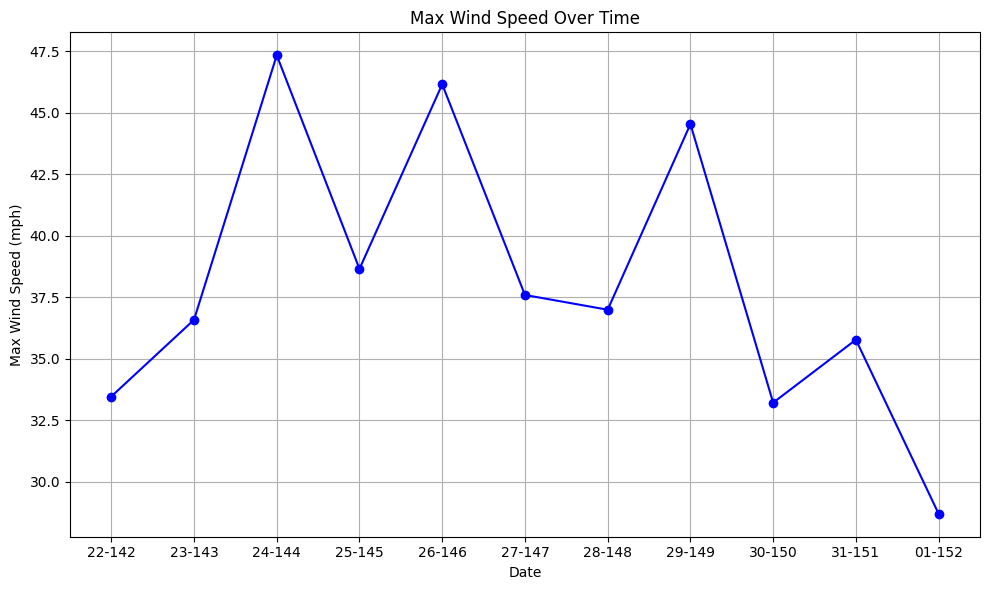

In [ ]:
# Read the CSV file
df = pd.read_csv('/content/drive/MyDrive/Cyclones_methods/binarization/mawar/tables/vertocity.csv')

# # Convert 'Date' column to datetime
# df['Day'] = pd.to_datetime(df['Day'])
# Extract the relevant parts of the 'Day' column and create a new column with the modified format
# df['Day_Modified'] = df['Day'].apply(lambda x: '-'.join(x.split('_')[0].split('-')[:2]) + '-' + x.split('_')[1][:3]) ### with month

df['Day_Modified'] = df['Day'].apply(lambda x: x.split('-')[0] + '-' + x.split('_')[1][:3])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(df['Day_Modified'], df['Vmax'], color='blue', marker='o', linestyle='-')
plt.title('Max Wind Speed Over Time')
plt.xlabel('Date')
plt.ylabel('Max Wind Speed (mph)')
plt.grid(True)
plt.tight_layout()
plt.show()


# **Functions**

In [ ]:
def gregorian_date_from_julian_day(year, julian_day):
    # Define the Julian day number for January 1st of the given year
    jan1_year = datetime(year, 1, 1)

    # Calculate the date by adding (julian_day - 1) days to January 1st
    date = jan1_year + timedelta(days=julian_day - 1)

    month_name = date.strftime('%b')
    #formated_date = date.strftime('%d-%m-%y')
    formated_date = date.strftime('%d')
    #day_number = date.day

    return month_name, formated_date, date

    # Example usage:
    #year = int(input())
    #julian_day = int(input())
    #month_name, formated_date, date = gregorian_date_from_julian_day(year, julian_day)
    #print(f"Date corresponding to the {julian_day}nd day of {year}: {formated_date}-{month_name}-{year}")
    #print(f"Date corresponding to the {julian_day}nd day of {year}: {month_name} {date.strftime('%d-%m-%Y')} ") # %y-for 23 small year %Y for full year
    #print(f"Date corresponding to the {julian_day}nd day of {year}: {formated_date}({month_name})")


def calculate_total_wind_speed(latitude_requested, longitude_requested, mlats, mlons, mwind_speed):

    lat_diff = np.abs(mlats - latitude_requested)
    lon_diff = np.abs(mlons - longitude_requested)

    # Find the index where the sum of differences is minimized
    total_diff = lat_diff + lon_diff
    min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)

    # Extract the indices for the closest point
    closest_index_0 = min_index[0]
    closest_index_1 = min_index[1]

    return mwind_speed[closest_index_0][closest_index_1], min_index

def cal_sub(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed, vorticity):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]
    vsubmatrix = vorticity[min_row:max_row+1, min_col:max_col+1]
    #vsubmatrix = 92
    return submatrix, vsubmatrix , min_row, min_col , max_row, min_col



# def cal_vor(lat_points, lon_points):
#     rage=[]

#     for lat_point, lon_point in zip(lat_points, lon_points):
#         # Find the indices of the point closest in both latitude and longitude
#         lat_diff = np.abs(masked_lats - lat_point)
#         lon_diff = np.abs(masked_lons - lon_point)
#         # Find the index where the sum of differences is minimized
#         total_diff = lat_diff + lon_diff
#         min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
#         rage.append(min_index)

#     # Extract the indices for the points defining the range
#     points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

#     # Extracting row and column indices
#     rows = [point[0] for point in points]
#     cols = [point[1] for point in points]

#     # Determine the range of rows and columns
#     min_row = min(rows)
#     max_row = max(rows)
#     min_col = min(cols)
#     max_col = max(cols)

#     # Extract submatrix
#     submatrix = vorticity[min_row:max_row+1, min_col:max_col+1]

#     # Find the index of the maximum value within the subset_matrix
#     max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)

#     # Return the wind speed at the maximum value index
#     return vorticity[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]

def cal_min(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmin(submatrix), submatrix.shape)

    # Return the wind speed at the maximum value index
    return masked_wind_speed[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]

def cal_max(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)
    print(max_index)
    # Return the wind speed at the maximum value index
    return masked_wind_speed[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]


def cal_mean(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage = []

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row + 1, min_col:max_col + 1]

    # Calculate the mean of the submatrix
    submatrix_mean = np.nanmean(submatrix)

    # Return the wind speed at the maximum value index and mean of the submatrix
    return submatrix_mean

def cal_max_sec(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)


    # Mask the maximum value
    submatrix[max_index[0], max_index[1]] = np.nan

    # Find the index of the new maximum value
    second_max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)
    # second_max_value = masked_wind_speed[min_row + second_max_index[0], min_col + second_max_index[1]]

    # # Restore the original value
    # masked_wind_speed[max_index] = max_value

    # return second_max_value

    # Return the wind speed at the maximum value index
    return masked_wind_speed[min_row + second_max_index[0], min_col + second_max_index[1]], min_row + second_max_index[0], min_col + second_max_index[1]

def cal_vor(lat_points, lon_points, masked_lats, masked_lons, vorticity):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = vorticity[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)

    # Return the wind speed at the maximum value index
    return vorticity[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]

def haversiner(lon1, lat1, lon2, lat2):
    """
    Calculate the great-circle distance between two points
    on the Earth's surface given their longitudes and latitudes
    in degrees.

    Returns the distance in kilometers.
    """
    # Convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    R = 6371  # Radius of the Earth in kilometers
    distance = R * c

    return distance

def contour_r(lat_points, lon_points, center_lat, center_lon, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # center_lat = 10.62
    # center_lon = 146.53

    # Define wind speed thresholds for R34, R50, and R64 (m/s)
    thresholds = {'R34': 17.4, 'R50': 25.7, 'R64': 32.9}

    # Calculate wind radii
    radii = {}
    for key, threshold in thresholds.items():
        distances = []
        for row in range(len(submatrix)):
            for col in range(len(submatrix[row])):
                # Calculate distance from center
                distance = haversiner(masked_lons[min_row+row, min_col+col], masked_lats[min_row+row, min_col+col], center_lon, center_lat)
                if submatrix[row][col] == threshold:
                    distances.append(distance)  # Distance from the center

        # if np.isnan(np.mean(distances)):
        #     # If no distances found for the current threshold, adjust threshold downwards
        #     print(threshold)
        #     adjusted_threshold = threshold - 1.0
        #     rlist = (submatrix > adjusted_threshold) & (submatrix <= threshold)

        #     # Add the wind speeds to list R34
        #     RC = submatrix[rlist].tolist()
        #     print(adjusted_threshold)
        #     print(RC)

        #     max_value = np.max(RC)
        #     max_index = np.where(RC == max_value)[0][-1]
        #     print(max_value)
        # else:
        #     radii[key] = np.mean(distances)
        if not np.isnan(np.mean(distances)):
            radii[key] = np.mean(distances)
        else:
            # If no distances found for the current threshold, adjust threshold downwards
            adjusted_threshold = threshold - 1
            rlist = (submatrix > adjusted_threshold) & (submatrix <= threshold)

            # Add the wind speeds to list R34
            RC = submatrix[rlist].tolist()
            # print(threshold)
            # print(adjusted_threshold)
            # print(RC)


            if len(RC) == 0:
                radii[key] = np.nan
                # print("The list is empty, breaking out of the loop")

            else:
                max_value = np.max(RC)
                max_index = np.where(RC == max_value)[0][-1]
                # print(max_value)
                # Recalculate radii with adjusted threshold
                for row in range(len(submatrix)):
                    for col in range(len(submatrix[row])):
                        distance = haversiner(masked_lons[min_row+row, min_col+col], masked_lats[min_row+row, min_col+col], center_lon, center_lat)
                        if submatrix[row][col] == max_value:
                            distances.append(distance)  # Distance from the center



                    # print("Maximum value:", max_value)
                    # print("Index of maximum value:", max_index)

                    # # Print R34
                    # print("Wind speeds between 17.0 and 17.9:", R34)

                    # print("Count of wind speeds equal to 17.5:", np.count_nonzero(cycbitwo == 17.5))

                    # if (submatrix[row][col] > adjusted_threshold and submatrix[row][col] <= threshold):
                    #     distances.append(distance)  # Distance from the center
                if not np.isnan(np.mean(distances)):
                    radii[key] = np.mean(distances)
                else:
                    # If no distances found even with adjusted threshold, set radius to 'nan'
                    radii[key] = np.nan

    # Format radii
    formatted_radii = {key: "{:.2f}".format(value) for key, value in radii.items()}

    # # Define wind speed thresholds for R34, R50, and R64 (m/s)
    # thresholds = {'R34': 17.5, 'R50': 25.7, 'R64': 32.9}

    # # Calculate wind radii
    # radii = {}
    # for key, threshold in thresholds.items():
    #     distances = []
    #     for row in range(len(submatrix)):
    #         for col in range(len(submatrix[row])):
    #             # Calculate distance from center
    #             distance = haversiner(masked_lons[min_row+row, min_col+col], masked_lats[min_row+row, min_col+col], center_lon, center_lat)
    #             if submatrix[row][col] == threshold:
    #                 distances.append(distance)  # Distance from the center
    #                 print(distance)
    #     radii[key] = np.mean(distances)

    # print(radii)

    formatted_radii = {key: "{:.2f}".format(value) for key, value in radii.items()}
    return formatted_radii


def calculate_direction(a1, a2, b1, b2):
    direction = ""

    if a1 > b1:
        if a2 > b2:
            direction = "S"
        elif a2 < b2:
            direction = "SE"
        else:
            direction = "E"
    elif a1 < b1:
        if a2 > b2:
            direction = "SW"
        elif a2 < b2:
            direction = "N"
        else:
            direction = "W"
    else:
        if a2 > b2:
            direction = "NE"
        elif a2 < b2:
            direction = "NW"
        else:
            direction = "same point"

    return direction

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great-circle distance between two points
    on the Earth's surface given their longitudes and latitudes
    in degrees.

    Returns the distance in kilometers.
    """
    # Convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    R = 6371  # Radius of the Earth in kilometers
    distance = R * c

    return "{:.2f}".format(distance)



def get_table(fdate, mon, year, julian_day, adpass, wind_fv, wind_speed_sec, dmaxspeed, masked_lats, masked_lons, masked_wind_speed, mslat, mslon, minbi, maxbi, min_row, min_col):
    # rmax = haversine(masked_lons[sb11, sb22], masked_lats[sb11, sb22], masked_lons[fl1 ,fl2 ], masked_lats[fl1 ,fl2 ])
    rmax = haversine(masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

    return fdate, mon, year, julian_day, adpass, masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], wind_fv, masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]] ,f"{wind_speed_sec:.2f}", rmax, dmaxspeed



# **Locations**

In [ ]:
##mawar

# location = '/content/drive/MyDrive/Cyclones/h5_files/mawar_files'
# cycs_location = '/content/drive/MyDrive/Cyclones/mawar'  #mawar
# filename = "/content/drive/MyDrive/Cyclones/mawar/matrix.csv"
# table_filename = '/content/drive/MyDrive/Cyclones/mawar/tables/'
# folder_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
# csv_filename = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
# least_filename = '/content/drive/MyDrive/Cyclones/mawar/least_10_windspeeds'
# word = 'mawar'

# ### biparjoy

location = '/content/drive/MyDrive/Cyclones/h5_files/biparjoy_files'
cycs_location = '/content/drive/MyDrive/Cyclones/biparjoy' #biparjoy
filename = "/content/drive/MyDrive/Cyclones/biparjoy/matrix.csv"
table_filename = '/content/drive/MyDrive/Cyclones/biparjoy/tables'
folder_path = '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones'
csv_filename = '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones'
least_filename = '/content/drive/MyDrive/Cyclones/biparjoy/least_10_windspeeds'
word = 'biparjoy'

#Creating Folders and  List of files

In [ ]:
wind_speed_cyclone_pass = []
vertocity_cenetr = []
quadrants_table_min = []
quadrants_table_max = []
quadrants_table_mean = []
colorhexnames = []
day_wise_report=[]
dwr=[]
max_wind_speed_dir_list=[]
max_wind_speed_dir = {}
trackc_lats = []
trackc_lons = []
image_binarization = []
coutputs = []

In [ ]:
def create_folder(mawar_folder):
    # Define subfolders
    subfolders = ['tables', 'plots', 'direction_fig', 'graphs', 'csvcyclones', 'least_10_windspeeds']

    # Loop through subfolders
    for subfolder in subfolders:
        subfolder_path = os.path.join(mawar_folder, subfolder)
        # Check if the subfolder exists
        if not os.path.exists(subfolder_path):
            # Create the subfolder if it doesn't exist
            os.makedirs(subfolder_path)
            print(f"Subfolder '{subfolder}' created inside '{mawar_folder}'.")
        else:
            print(f"Subfolder '{subfolder}' already exists inside '{mawar_folder}'.")


def create_folders(folder_path):

    # Check if the main folder exists
    if not os.path.exists(folder_path):
        # Create the main folder if it doesn't exist
        os.makedirs(folder_path)
        print(f"Folder '{folder_path}' created.")

    # Create 'mawar' folder inside 'cyclone'
    # mawar_folder = os.path.join(folder_path, 'mawar')
    mawar_folder = os.path.join(folder_path, '{}'.format(word))
    if not os.path.exists(mawar_folder):
        os.makedirs(mawar_folder)
        print(f"Folder '{word}' created inside '{folder_path}'.")
    create_folder(mawar_folder)  # Corrected function name


# Specify the main folder path
main_folder_path = '/content/drive/MyDrive/Cyclones'

# Call the function to create folders
create_folders(main_folder_path)



Subfolder 'tables' already exists inside '/content/drive/MyDrive/Cyclones/biparjoy'.
Subfolder 'plots' already exists inside '/content/drive/MyDrive/Cyclones/biparjoy'.
Subfolder 'direction_fig' already exists inside '/content/drive/MyDrive/Cyclones/biparjoy'.
Subfolder 'graphs' already exists inside '/content/drive/MyDrive/Cyclones/biparjoy'.
Subfolder 'csvcyclones' already exists inside '/content/drive/MyDrive/Cyclones/biparjoy'.
Subfolder 'least_10_windspeeds' created inside '/content/drive/MyDrive/Cyclones/biparjoy'.


# **Image Binarization**

In [ ]:
# def extract_group_of_ones(matrix):
#     # Find all indices where the value is 1
#     indices = np.argwhere(matrix == 1)

#     # Find the minimum and maximum row and column indices
#     min_row, min_col = np.min(indices, axis=0)
#     max_row, max_col = np.max(indices, axis=0)

#     # Extract the group of 1's
#     group_of_ones = matrix[min_row:max_row+1, min_col:max_col+1]

#     return group_of_ones

from scipy.ndimage import label, find_objects

def binarize_image(matrix, threshold):
    binarized_matrix = np.where(matrix >= threshold, 1, 0)
    return binarized_matrix

def extract_largest_group_of_onesss(matrix):
    # Label connected components
    labeled_matrix, num_features = label(matrix)

    # Find the sizes of connected components
    sizes = [np.sum(labeled_matrix == i) for i in range(1, num_features + 1)]

    if len(sizes) == 0:
        return None  # No ones found

    # Get the index of the largest connected component
    largest_idx = np.argmax(sizes) + 1

    # Extract the largest connected component
    largest_group = (labeled_matrix == largest_idx)

    # Find all indices where the value is 1
    indices = np.argwhere(largest_group)

    return indices


def extract_largest_group_of_ones(matrix):
    # Label connected components
    labeled_matrix, num_features = label(matrix)

    # Find the sizes of connected components
    sizes = [np.sum(labeled_matrix == i) for i in range(1, num_features + 1)]

    if len(sizes) == 0:
        return None  # No ones found

    # Get the index of the largest connected component
    largest_idx = np.argmax(sizes) + 1

    # Extract the largest connected component
    largest_group = (labeled_matrix == largest_idx).astype(float)

    larg_grp = (labeled_matrix == largest_idx).astype(int)

    # return largest_group
    # Find all indices where the value is 1
    indices = np.argwhere(largest_group == 1)
    bi_ind = indices

    # Find the minimum and maximum row and column indices
    min_row, min_col = np.min(indices, axis=0)
    max_row, max_col = np.max(indices, axis=0)

    # Extract the group of 1's
    group_of_ones = largest_group[min_row:max_row+1, min_col:max_col+1]
    return group_of_ones, bi_ind ,larg_grp


def count_zeroes(row, j, cycbitwo, cyc_matrix):
    if np.count_nonzero(row) <= 2:  # If the row has only one or two non-zero elements
        return "nope"
    elif np.count_nonzero(row) == 0:  # If the row is completely filled with zeroes
        return "nope"
    else:
        first_non_zero_index = np.argmax(row != 0)
        last_non_zero_index = len(row) - np.argmax(row[::-1] != 0) - 1
        # print(j)
        # print(first_non_zero_index)
        # print(last_non_zero_index)
        for k in range(first_non_zero_index + 1, last_non_zero_index):
            # print(i)
            cycbitwo[j][k]=cyc_matrix[j][k]
        return np.count_nonzero(row[first_non_zero_index + 1:last_non_zero_index] == 0)

def cal_min(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmin(submatrix), submatrix.shape)

    # Return the wind speed at the maximum value index
    return masked_wind_speed[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]

def plot_image(matrix, title):
    plt.imshow(matrix, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

def modify_indices_if_masked(masked_array, row_indices, col_indices):
    """
    Modify the row and column indices to 1 if the corresponding values in the masked array are masked.
    """
    modified_row_indices = []
    modified_col_indices = []

    for row, col in zip(row_indices, col_indices):
        if masked_array[row, col] is np.ma.masked:
            ma= find_nearest_non_masked_value(masked_array, row, col)#min_row, min_col
            modified_row_indices.append(ma[0])
            modified_col_indices.append(ma[1])
            # print(row, col)
        else:
            # print(row, col)
            modified_row_indices.append(row)
            modified_col_indices.append(col)

    return modified_row_indices, modified_col_indices



def find_nearest_non_masked_value(masked_array, row, col, max_radius=200):
    """
    Find the nearest non-masked value to the specified index (row, col) in the masked array.
    Expand the neighborhood iteratively until a non-masked value is found or the maximum radius is reached.
    """
    rows, cols = masked_array.shape

    for radius in range(1, max_radius + 1):
        # Define the neighborhood around the index with the current radius
        neighborhood = []
        for i in range(row - radius, row + radius + 1):
            for j in range(col - radius, col + radius + 1):
                if 0 <= i < rows and 0 <= j < cols and masked_array[i, j] is not np.ma.masked:
                    return i, j  # Found a non-masked value within the neighborhood

    return None




In [ ]:
os.chdir(location)

#mawar

#file_path = "E06SCTL2B2023142_02558_02559_NS_12km_2023-142T20-40-49_v1.0.2.h5" #ok floor
#file_path = "E06SCTL2B2023143_02572_02573_NS_12km_2023-143T04-48-38_v1.0.2.h5" #ok-pass
#file_path = "E06SCTL2B2023144_02587_02588_NS_12km_2023-144T20-09-52_v1.0.2.h5" #ok-pass
#file_path = "E06SCTL2B2023145_02608_02609_SN_12km_2023-145T19-58-19_v1.0.2.h5" #ok-pass-use special lats and remove floor
#file_path = "E06SCTL2B2023146_02616_02617_NS_12km_2023-149T11-02-04_v1.0.2.h5" #ok remove floor
#file_path = "E06SCTL2B2023147_02637_02638_SN_12km_2023-147T20-03-32_v1.0.2.h5" #ok-pass use special lats and keep or remove floor
#file_path = "E06SCTL2B2023148_02652_02653_SN_12km_2023-148T16-23-41_v1.0.2.h5" #ok-pass use special lats and remove floor
#file_path = "E06SCTL2B2023149_02660_02661_NS_12km_2023-149T04-45-18_v1.0.2.h5" #ok remove floor
#file_path = "E06SCTL2B2023150_02681_02682_SN_12km_2023-150T16-33-41_v1.0.2.h5" #ok-pass use special lats and keep floor
#file_path = "E06SCTL2B2023151_02689_02690_NS_12km_2023-151T04-53-12_v1.0.2.h5" #ok-pass use special lats and keep floor
#file_path = "E06SCTL2B2023152_02703_02704_NS_12km_2023-152T04-05-02_v1.0.2.h5" #ok - dont keep floor

#----------------------------------------------------------------------------------------------------------------------------

#biparjoy

#file_path = 'E06SCTL2B2023154_02741_02742_SN_12km_2023-154T20-11-02_v1.0.2.h5' - waste
#file_path = 'E06SCTL2B2023154_02735_02736_NS_12km_2023-154T10-49-27_v1.0.2.h5' - waste
#file_path = 'E06SCTL2B2023155_02749_02750_NS_12km_2023-155T08-16-02_v1.0.2.h5' -waste
#file_path = 'E06SCTL2B2023156_02770_02771_SN_12km_2023-156T20-39-14_v1.0.2.h5' -waste
#file_path = 'E06SCTL2B2023157_02778_02779_NS_12km_2023-157T11-24-35_v1.0.2.h5'
file_path = 'E06SCTL2B2023159_02807_02808_NS_12km_2023-159T09-33-31_v1.0.2.h5'
#file_path = 'E06SCTL2B2023160_02821_02822_NS_12km_2023-160T08-45-23_v1.0.2.h5' -waste
#file_path = 'E06SCTL2B2023161_02836_02837_NS_12km_2023-161T19-38-34_v1.0.2.h5'
#file_path = 'E06SCTL2B2023162_02850_02851_NS_12km_2023-162T20-44-12_v1.0.2.h5'
#file_path = 'E06SCTL2B2023163_02865_02866_NS_12km_2023-163T09-48-17_v1.0.2.h5'


#----------------------------------------------------------------------------------------------------------------------------
year, julian_day = re.findall(r'(\d{4})(\d{3})_', file_path)[0]
#print(julian_day, year)
mon, fdate, d2 = gregorian_date_from_julian_day(int(year), int(julian_day))
# Extracting NS or SN
adpass = re.findall(r'_(\w{2})_\d{2}km_', file_path)[0]
a = 7


# Read data from HDF5 file
with h5py.File(file_path, 'r') as f:
    LATITUDE_25 = f['/science_data/Latitude'][:]
    LONGITUDE_25 = f['/science_data/Longitude'][:]
    ws = f['/science_data/Wind_speed_selection'][:]
    wd = f['/science_data/Wind_direction_selection'][:]

    # Data processing
    LATITUDE_25 = LATITUDE_25.astype(float) / 100
    LONGITUDE_25 = LONGITUDE_25.astype(float) / 100
    wd = wd.astype(float) / 100
    ws = ws.astype(float) / 100
    LATITUDE_25[LATITUDE_25 == 327.67] = np.nan
    LONGITUDE_25[LONGITUDE_25 == 655.35] = np.nan
    ws[ws == 327.67] = np.nan
    wd[wd == 655.35] = np.nan

    lat = LATITUDE_25
    lon = LONGITUDE_25
    u = ws * np.cos(np.radians(wd))
    v = ws * np.sin(np.radians(wd))
    #u = ws * np.cos(np.deg2rad(wd))
    #v = ws * np.sin(np.deg2rad(wd))
    # Plotting Wind
    # wind_cal_speed = np.array(ws)
    wind_speed_matrix = np.array(ws)
    zonal_wind_speed_matrix = np.array(u)
    meridional_wind_speed_matrix = np.array(v)


    # print(wind_cal_speed.shape)
    # Replace 'lats' and 'lons' with your latitude and longitude arrays corresponding to the wind speed matrix
    lats = np.array(lat)
    lons = np.array(lon)

    # Create masked arrays to handle NaN values in the wind speed, latitude, and longitude arrays
    # masked_wind_cal_speed = np.ma.masked_invalid(wind_cal_speed)
    masked_wind_speed = np.ma.masked_invalid(wind_speed_matrix)
    masked_lats = np.ma.masked_invalid(lats)
    masked_lons = np.ma.masked_invalid(lons)
    masked_zonal_wind_speed = np.ma.masked_invalid(zonal_wind_speed_matrix)
    masked_meridional_wind_speed = np.ma.masked_invalid(meridional_wind_speed_matrix)

    mmasked_zonal_wind_speed = np.ma.masked_invalid(np.array(ws * np.sin(np.radians(wd))))
    mmasked_meridional_wind_speed = np.ma.masked_invalid(np.array(ws * np.cos(np.radians(wd))))
    # scatterometer wind data (u and v components)
    # Replace these arrays with your actual wind data

    #marwar
    min_lat = 0.0  # Minimum latitude
    max_lat = 35.0  # Maximum latitude
    min_lon = 110.0  # Minimum longitude
    max_lon = 170.0  # Maximum longitude

    # # #biparjoy

    # min_lat = 0.0  # Minimum latitude
    # max_lat = 60.0  # Maximum latitude
    # min_lon = 20.0  # Minimum longitude
    # max_lon = 80.0  # Maximum longitude

    wlat = [max_lat, max_lat, min_lat, min_lat, max_lat]
    wlon = [min_lon, max_lon, max_lon, min_lon, min_lon]


    # Example 2D matrix
    matrix, vmatrix ,mslat, mslon, mslat1, mslon1 = cal_sub(wlat, wlon)
    # print(mslat, mslon)
    # print(masked_lats.shape)
    # print(matrix.shape)
    threshold = 17.6

    # Binarize the image
    binarized_image = binarize_image(matrix, threshold)

    largest_group_of_ones, bi_indices , lar_grp = extract_largest_group_of_ones(binarized_image)
    if largest_group_of_ones is None:
        print("No largest group of ones found.")


    # group_of_ones = extract_group_of_ones(largest_group_of_ones)

    indices = extract_largest_group_of_onesss(largest_group_of_ones)

    # Now you can create a new matrix using these indices
    #----------------------------------------------------------------------------------------------------------------------------
    #----------------------------------------------------------------------------------------------------------------------------
    #----------------------------------------------------------------------------------------------------------------------------

    # Now you can create a new matrix using these indices
    cycb = np.zeros_like(matrix)
    for idx in extract_largest_group_of_onesss(binarized_image):
        cycb[tuple(idx)] = matrix[tuple(idx)]

    #----------------------------------------------------------------------------------------------------------------------------
    #----------------------------------------------------------------------------------------------------------------------------
    #----------------------------------------------------------------------------------------------------------------------------


    # largest_group_of_ones, bi_indices , lar_grp= extract_largest_group_of_ones(binarized_image)
    # if largest_group_of_ones is None:
    #     print("No largest group of ones found.")

    # indices = extract_largest_group_of_onesss(largest_group_of_ones)
    # print(bi_indices)
    # Now you can create a new matrix using these indices
    cycbione = np.zeros_like(largest_group_of_ones)
    # Find the minimum and maximum row and column indices
    min_row, min_col = np.min(bi_indices, axis=0)
    max_row, max_col = np.max(bi_indices, axis=0)

    def modify_indices_if_masked(masked_array, row_indices, col_indices):
        """
        Modify the row and column indices to 1 if the corresponding values in the masked array are masked.
        """
        modified_row_indices = []
        modified_col_indices = []

        for row, col in zip(row_indices, col_indices):
            if masked_array[row, col] is np.ma.masked:
                ma= find_nearest_non_masked_value(masked_lats, min_row, min_col)
                modified_row_indices.append(ma[0])
                modified_col_indices.append(ma[1])
                # print(row, col)
            else:
                # print(row, col)
                modified_row_indices.append(row)
                modified_col_indices.append(col)

        return modified_row_indices, modified_col_indices



    def find_nearest_non_masked_value(masked_array, row, col, max_radius=50):
        """
        Find the nearest non-masked value to the specified index (row, col) in the masked array.
        Expand the neighborhood iteratively until a non-masked value is found or the maximum radius is reached.
        """
        rows, cols = masked_array.shape

        for radius in range(1, max_radius + 1):
            # Define the neighborhood around the index with the current radius
            neighborhood = []
            for i in range(row - radius, row + radius + 1):
                for j in range(col - radius, col + radius + 1):
                    if 0 <= i < rows and 0 <= j < cols and masked_array[i, j] is not np.ma.masked:
                        return i, j  # Found a non-masked value within the neighborhood

        return None


    evlan = [max_row, max_row, min_row, min_row, max_row]
    evlon = [min_col, max_col, max_col, min_col, min_col]



    # Modify indices if any of the indices have masked values
    #modified_evlan, modified_evlon = modify_indices_if_masked(masked_lats, evlan, evlon)

    #print(cal_min(modified_evlan, modified_evlon))
    # print(cal_max(modified_evlan, modified_evlon))
    # print(evlan, evlon)
    # print(modified_evlan, modified_evlon)
    # for row, col in zip(modified_evlan, modified_evlon):
    #         print(masked_lats[row, col])
    # print(max_row, min_col)
    # print(min_row, min_col, max_row, max_col)

    # # print(matrix[max_row, min_col])
    # print(masked_lats[max_row, min_col], masked_lons[max_row, min_col])
    # print(masked_lats[max_row, max_col], masked_lons[max_row, max_col])
    # print(masked_lats[min_row, max_col], masked_lons[min_row, max_col])
    # print(masked_lats[min_row, min_col], masked_lons[min_row, min_col])
    # print(masked_wind_speed[min_row, min_col])

    # if masked_lats[min_row, min_col] is np.ma.masked:
    #     ma= find_nearest_non_masked_value(masked_lats, min_row, min_col)
    #     print(masked_lats[ma[0], ma[1]] , ma)
    #     print("The value is masked.")




    cyc_matrix = matrix[min_row:max_row+1, min_col:max_col+1]

    # # Extract the group of 1's
    # group_of_ones = largest_group[min_row:max_row+1, min_col:max_col+1]
    for idx in indices:
        cycbione[tuple(idx)] = cyc_matrix[tuple(idx)]
    # matrix_array = np.array(matrix)

    values = cycbione.flatten()
    non_zero_indices = np.argwhere(values != 0).flatten()  # Indices of non-zero values

    # Check if there are any elements left after removal
    if len(non_zero_indices) == 0:
        min_index = None
        max_index = None
        min_value = None
        max_value = None
    else:
        # Find the index of the minimum value among non-zero elements
        min_index = non_zero_indices[np.argmin(values[non_zero_indices])]
        # Find the index of the maximum value among non-zero elements
        max_index = non_zero_indices[np.argmax(values[non_zero_indices])]
        # Get the minimum and maximum values
        min_value = values[min_index]
        max_value = values[max_index]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(max_index, cycbione.shape)
    # print("Minimum value:", min_value)
    # print("Index of Minimum value:", min_index)
    # print("Maximum value:", max_value)
    # print("Index of Maximum value:", max_index)

    # lat_diff = np.abs(masked_lats - 60.0)
    # lon_diff = np.abs(masked_lons - 100.0)

    lat_diff = np.abs(masked_lats - masked_lats[max_row, min_col])
    lon_diff = np.abs(masked_lons - masked_lons[max_row, min_col])

    # Find the index where the sum of differences is minimized
    total_diff = lat_diff + lon_diff

    cdindex = np.unravel_index(total_diff.argmin(), total_diff.shape)

    print("----------------------------------")

    lon_diff = np.abs(masked_wind_speed - masked_wind_speed[max_row, min_col])

    # Find the index where the sum of differences is minimized
    total_diff = lat_diff + lon_diff

    cdindex = np.unravel_index(total_diff.argmin(), total_diff.shape)

    # print("----------------------------------")

    # print(max_row, min_col)

    # print(cdindex)

    # print(masked_lats[cdindex[0], cdindex[1]], masked_lons[cdindex[0], cdindex[1]])

    # print(masked_lats[cdindex[0] + max_index[0],cdindex[1] + max_index[1]], masked_lons[cdindex[0] + max_index[0],cdindex[1] + max_index[1]])

    # print(masked_lats[min_row + cdindex[0] + max_index[0],min_col+cdindex[1]+max_index[1]], masked_lons[min_row+cdindex[0]+max_index[0],min_col+cdindex[1]+max_index[1]])

    # print("----------------------------------")
    #----------------------------------------------------------------------------------------------------------------------------

    cycbitwo = np.copy(cycbione)
    zeroes_counts = [count_zeroes(row, i) for i, row in enumerate(cycbitwo)]


    cycbitwo[cycbitwo == 0] = np.nan

    minbi = np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape)

    # Create a list of tuples containing value and its indices
    value_index_list = [(value, (i, j)) for i, row in enumerate(cycbitwo) for j, value in enumerate(row) if not np.isnan(value)]

    # Sort the list based on values
    sorted_value_index_list = sorted(value_index_list, key=lambda x: x[0])

    # Take the least 10 values along with their indices
    least_10_values_indices = sorted_value_index_list[:10]
    modified_least_10 = []
    for value, indices_tuple in least_10_values_indices:
        zero_index = mslat + min_row + indices_tuple[0]
        first_index = mslon + min_col + indices_tuple[1]
        modified_least_10.append((value, (masked_lats[zero_index, first_index], masked_lons[zero_index, first_index])))

    print(modified_least_10)

    # matrix[matrix == cycbitwo[minbi[0],minbi[1]]] = np.nan
    # minwindspeed = cycbitwo[minbi[0],minbi[1]]
    # masked_wind_speed[masked_wind_speed == minwindspeed] = np.nan

    #masked_wind_speed[min_row:max_row+1, min_col:max_col+1] = matrix[min_row:max_row+1, min_col:max_col+1]
    #masked_wind_speed[min_row:max_row+1, min_col:max_col+1] = cycbitwo

    # print(np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape))


    # Return the wind speed at the maximum value index
    print("Min : ", cycbitwo[minbi[0],minbi[1]])

    print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

    # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], min_row+cdindex[0]+minbi[0], min_col+cdindex[1]+minbi[1])

    # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lats[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lons[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]])

    print("----------------------------------")

    # win_diff = np.abs(masked_wind_speed - cycbitwo[minbi[0],minbi[1]])

    # # Find the index where the sum of differences is minimized
    # # total_diff = lat_diff + lon_diff

    # winmin = np.unravel_index(win_diff.argmin(), win_diff.shape)

    # print(masked_wind_speed[winmin[0], winmin[1]], masked_lats[winmin[0], winmin[1]], masked_lons[winmin[0], winmin[1]])

    print("----------------------------------")

    maxbi = np.unravel_index(np.nanargmax(cycbione), cycbione.shape)

    # print(np.unravel_index(np.nanargmax(cycbione), cycbione.shape))
    # Return the wind speed at the maximum value index
    print("Max : ", cycbitwo[maxbi[0],maxbi[1]])
    print(masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])
    # masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]]
    # print(masked_wind_speed[min_row+ cdindex[0] + maxbi[0],min_col+cdindex[1]+maxbi[1]], min_row+cdindex[0]+minbi[0], min_col+cdindex[1]+maxbi[1])

    # print(masked_wind_speed[min_row+cdindex[0]+maxbi[0],min_col+cdindex[1]+maxbi[1]], masked_lats[min_row+cdindex[0]+maxbi[0],min_col+cdindex[1]+maxbi[1]], masked_lons[min_row+cdindex[0]+maxbi[0],min_col+cdindex[1]+maxbi[1]])

    print("----------------------------------")

    # win_diff = np.abs(masked_wind_speed - cycbitwo[maxbi[0],maxbi[1]])

    # # Find the index where the sum of differences is minimized
    # # total_diff = lat_diff + lon_diff

    # winmax = np.unravel_index(win_diff.argmin(), win_diff.shape)

    # print(masked_wind_speed[winmax[0], winmax[1]], masked_lats[winmax[0], winmax[1]], masked_lons[winmax[0], winmax[1]])

    # print("----------------------------------")

    # cycs_location = '/content/drive/MyDrive/Cyclones/mawar'  #mawar
    # cycs_location = '/content/drive/MyDrive/Cyclones/biparjoy' #biparjoy

    # filename = os.path.join(cycs_location, 'cycbione.csv')
    # # Write the matrix to the CSV file
    # with open(filename, 'w', newline='') as csvfile:
    #     csvwriter = csv.writer(csvfile)
    #     csvwriter.writerows(cycbione)

    # filename = os.path.join(cycs_location, 'cyc_matrix.csv')
    # # Write the matrix to the CSV file
    # with open(filename, 'w', newline='') as csvfile:
    #     csvwriter = csv.writer(csvfile)
    #     csvwriter.writerows(cyc_matrix)

    # filename = os.path.join(cycs_location, 'cycbitwo.csv')
    # # Write the matrix to the CSV file
    # with open(filename, 'w', newline='') as csvfile:
    #     csvwriter = csv.writer(csvfile)
    #     csvwriter.writerows(cycbitwo)

    # image_binarization.append((julian_day ,'{}m/s'.format(cycbitwo[minbi[0],minbi[1]]), '({}, {})'.format(masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]]), '{}m/s'.format(cycbitwo[maxbi[0],maxbi[1]]),  '({}, {})'.format(masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])))

    # # Save the wind speed data to a CSV file
    # with open(os.path.join(cycs_location, 'image_binarization.csv'), 'w', newline='') as csvfile:
    #     writer = csv.writer(csvfile)
    #     writer.writerow(['julian_day' ,'Min_ws', 'lats & lons', 'Max_ws',  'lats & lons'])
    #     writer.writerows(image_binarization)

    #Plots
    plot_image(matrix, 'Original Image')
    plt.axis('off')
    plt.title('EOS-06 SCAT matrix', fontsize=25)
    plt.imshow(matrix, cmap='gray')  # Assuming grayscale image
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/matrix.png', dpi=100)

    plot_image(binarized_image, 'BI (Th = {}) all1s'.format(threshold))
    plt.axis('off')
    plt.title('EOS-06 SCAT binarized_image', fontsize=25)
    plt.imshow(binarized_image, cmap='gray')  # Assuming grayscale image
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/binarized_image.png', dpi=100)

    plot_image(largest_group_of_ones, 'largest group')
    plt.axis('off')
    plt.title('EOS-06 SCAT largest_group_of_ones', fontsize=25)
    plt.imshow(largest_group_of_ones, cmap='gray')  # Assuming grayscale image
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/largest_group_of_ones.png', dpi=100)

    # print(cycbione[minbi[0], minbi[1]])
    plot_image(cycb, 'bi_cycbi Image')
    plt.axis('off')
    plt.title('EOS-06 SCAT cycb', fontsize=25)
    plt.imshow(cycb, cmap='gray')  # Assuming grayscale image
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/cycb.png', dpi=100)

    plot_image(cycbione, 'bi_cycbi Image')
    plt.axis('off')
    plt.title('EOS-06 SCAT cycbione', fontsize=25)
    plt.imshow(cycbione, cmap='gray')  # Assuming grayscale image
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/cycbione.png', dpi=100)
    # # plot_image(group_of_ones, 'cyclone Image')

    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/matrix.png', dpi=100)
    # plt.close()

    # Plot and save the binarized image
    # plot_image(binarized_image, 'BI (Th = {}) all1s'.format(threshold))
    # # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/binarized_image.png', dpi=100)
    # # plt.close()

    # # Plot and save the largest group of ones
    # plot_image(largest_group_of_ones, 'largest group')
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/largest_group.png', dpi=100)
    # # plt.close()

    # # Plot and save the bi_cycbi image
    # plot_image(cycb, 'bi_cycbi Image')
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/bi_cycbi_image.png', dpi=100)
    # # plt.close()

    # # Plot and save the bi_cycbi image
    # plot_image(cycbione, 'bi_cycbi Image')
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/bi_cycbione_image.png', dpi=100)
    plt.close()



FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = 'E06SCTL2B2023159_02807_02808_NS_12km_2023-159T09-33-31_v1.0.2.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
print(image_binarization)

[('142', '11.39m/s', '33.46m/s'), ('143', '11.93m/s', '36.58m/s'), ('144', '13.68m/s', '50.0m/s'), ('144', '13.68m/s', '(38.3, 149.44)', '50.0m/s', '(38.3, 147.19)'), ('144', '13.68m/s', '(38.3, 149.44)', '50.0m/s', '(38.3, 147.19)'), ('142', '11.39m/s', '(9.02, 147.15)', '33.46m/s', '(9.02, 147.31)'), ('143', '11.93m/s', '(10.62, 146.53)', '36.58m/s', '(10.62, 146.61)'), ('144', '13.68m/s', '(38.3, 149.44)', '50.0m/s', '(38.3, 147.19)'), ('145', '12.1m/s', '(14.68, 138.93)', '38.65m/s', '(14.68, 140.51)'), ('146', '13.66m/s', '(14.65, 139.7)', '46.16m/s', '(14.65, 138.17)'), ('147', '10.74m/s', '(15.4, 133.6)', '37.59m/s', '(15.4, 130.59)'), ('148', '8.91m/s', '(18.27, 127.0)', '36.99m/s', '(18.27, 126.5)'), ('149', '11.21m/s', '(19.35, 125.89)', '44.54m/s', '(19.35, 125.36)'), ('150', '10.35m/s', '(19.42, 126.81)', '33.21m/s', '(19.42, 125.22)'), ('151', '10.62m/s', '(22.07, 125.29)', '35.77m/s', '(22.07, 125.22)'), ('152', '11.32m/s', '(24.51, 126.83)', '28.69m/s', '(24.51, 127.79)'

In [ ]:
import os

# Define the directory path
directory = '/content/drive/MyDrive/Cyclones/h5_files/biparjoy_files/'

# List all files in the directory
files = os.listdir(directory)

# Filter out the files with the .h5 extension
h5_files = [file for file in files if file.endswith('.h5')]

# Print the list of .h5 files
for h5_file in h5_files:
    print(h5_file)



E06SCTL2B2023154_02741_02742_SN_12km_2023-154T20-11-02_v1.0.2.h5
E06SCTL2B2023155_02749_02750_NS_12km_2023-155T08-16-02_v1.0.2.h5
E06SCTL2B2023156_02770_02771_SN_12km_2023-156T20-39-14_v1.0.2.h5
E06SCTL2B2023157_02778_02779_NS_12km_2023-157T11-24-35_v1.0.2.h5
E06SCTL2B2023159_02807_02808_NS_12km_2023-159T09-33-31_v1.0.2.h5
E06SCTL2B2023160_02821_02822_NS_12km_2023-160T08-45-23_v1.0.2.h5
E06SCTL2B2023161_02836_02837_NS_12km_2023-161T19-38-34_v1.0.2.h5
E06SCTL2B2023162_02850_02851_NS_12km_2023-162T20-44-12_v1.0.2.h5
E06SCTL2B2023163_02865_02866_NS_12km_2023-163T09-48-17_v1.0.2.h5
E06SCTL2B2023154_02735_02736_NS_12km_2023-154T10-49-27_v1.0.2.h5


# **Potting**

In [ ]:
#location = '/home/shashank/Desktop/bhoonidhi/input_data'
os.chdir(location)

file_path = "E06SCTL2B2023142_02558_02559_NS_12km_2023-142T20-40-49_v1.0.2.h5"
#file_path = "E06SCTL2B2023143_02572_02573_NS_12km_2023-143T04-48-38_v1.0.2.h5"
#file_path = "E06SCTL2B2023144_02587_02588_NS_12km_2023-144T20-09-52_v1.0.2.h5"
#file_path = "E06SCTL2B2023145_02608_02609_SN_12km_2023-145T19-58-19_v1.0.2.h5"
#file_path = "E06SCTL2B2023146_02616_02617_NS_12km_2023-149T11-02-04_v1.0.2.h5"
#file_path = "E06SCTL2B2023147_02637_02638_SN_12km_2023-147T20-03-32_v1.0.2.h5"
#file_path = "E06SCTL2B2023148_02652_02653_SN_12km_2023-148T16-23-41_v1.0.2.h5"
#file_path = "E06SCTL2B2023149_02660_02661_NS_12km_2023-149T04-45-18_v1.0.2.h5"
#file_path = "E06SCTL2B2023150_02681_02682_SN_12km_2023-150T16-33-41_v1.0.2.h5"
#file_path = "E06SCTL2B2023151_02689_02690_NS_12km_2023-151T04-53-12_v1.0.2.h5"
#file_path = "E06SCTL2B2023152_02703_02704_NS_12km_2023-152T04-05-02_v1.0.2.h5"

#----------------------------------------------------------------------------------------------------------------------------

#biparjoy

#file_path = 'E06SCTL2B2023157_02778_02779_NS_12km_2023-157T11-24-35_v1.0.2.h5'
#file_path = 'E06SCTL2B2023159_02807_02808_NS_12km_2023-159T09-33-31_v1.0.2.h5'
#file_path = 'E06SCTL2B2023161_02836_02837_NS_12km_2023-161T19-38-34_v1.0.2.h5'
#file_path = 'E06SCTL2B2023162_02850_02851_NS_12km_2023-162T20-44-12_v1.0.2.h5'
#file_path = 'E06SCTL2B2023163_02865_02866_NS_12km_2023-163T09-48-17_v1.0.2.h5'


#----------------------------------------------------------------------------------------------------------------------------

year, julian_day = re.findall(r'(\d{4})(\d{3})_', file_path)[0]
#print(julian_day, year)
mon, fdate, d2 = gregorian_date_from_julian_day(int(year), int(julian_day))
# Extracting NS or SN
adpass = re.findall(r'_(\w{2})_\d{2}km_', file_path)[0]
a = 7

#colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
colorbar_ticks = [0, 4, 8, 12, 16, 20]
colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels were these lables genuine if so then how was it decided

levels = np.linspace(0.0, 20)


#colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
color_ticks = [-24, -16, -8, 0, 8, 16, 24]
color_labels = ['-24','-16', '-8', '0', '8', '16', '24']  # Corresponding labels were these lables genuine if so then how was it decided

levels = np.linspace(-20, 20)


# Read data from HDF5 file
with h5py.File(file_path, 'r') as f:
    LATITUDE_25 = f['/science_data/Latitude'][:]
    LONGITUDE_25 = f['/science_data/Longitude'][:]
    ws = f['/science_data/Wind_speed_selection'][:]
    wd = f['/science_data/Wind_direction_selection'][:]

    # Data processing
    LATITUDE_25 = LATITUDE_25.astype(float) / 100
    LONGITUDE_25 = LONGITUDE_25.astype(float) / 100
    wd = wd.astype(float) / 100
    ws = ws.astype(float) / 100
    LATITUDE_25[LATITUDE_25 == 327.67] = np.nan
    LONGITUDE_25[LONGITUDE_25 == 655.35] = np.nan
    ws[ws == 327.67] = np.nan
    wd[wd == 655.35] = np.nan

    lat = LATITUDE_25
    lon = LONGITUDE_25
    u = ws * np.cos(np.radians(wd))
    v = ws * np.sin(np.radians(wd))
    #u = ws * np.cos(np.deg2rad(wd))
    #v = ws * np.sin(np.deg2rad(wd))
    # Plotting Wind
    # wind_cal_speed = np.array(ws)
    wind_speed_matrix = np.array(ws)
    zonal_wind_speed_matrix = np.array(u)
    meridional_wind_speed_matrix = np.array(v)


    # print(wind_cal_speed.shape)
    # Replace 'lats' and 'lons' with your latitude and longitude arrays corresponding to the wind speed matrix
    lats = np.array(lat)
    lons = np.array(lon)

    # Create masked arrays to handle NaN values in the wind speed, latitude, and longitude arrays
    # masked_wind_cal_speed = np.ma.masked_invalid(wind_cal_speed)
    masked_wind_speed = np.ma.masked_invalid(wind_speed_matrix)
    masked_lats = np.ma.masked_invalid(lats)
    masked_lons = np.ma.masked_invalid(lons)
    masked_zonal_wind_speed = np.ma.masked_invalid(zonal_wind_speed_matrix)
    masked_meridional_wind_speed = np.ma.masked_invalid(meridional_wind_speed_matrix)

    mmasked_zonal_wind_speed = np.ma.masked_invalid(np.array(ws * np.sin(np.radians(wd))))
    mmasked_meridional_wind_speed = np.ma.masked_invalid(np.array(ws * np.cos(np.radians(wd))))
    # scatterometer wind data (u and v components)
    # Replace these arrays with your actual wind data
    res = 0.125
    DY = res * 6370e3 * 2 * np.pi / 360 * np.ones_like(lat)  # Assuming constant grid spacing in latitude
    DX = DY * np.cos(np.deg2rad(lat))  # Grid spacing in longitude depends on latitude

    u_x = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
    u_y = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
    u_x[1:-1, 1:-1] = u
    u_y[1:-1, 1:-1] = v

    u_x[0, :] = u_x[-2, :]
    u_x[-1, :] = u_x[1, :]
    u_x[:, 0] = u_x[:, -2]
    u_x[:, -1] = u_x[:, 1]
    u_y[0, :] = u_y[-2, :]
    u_y[-1, :] = u_y[1, :]
    u_y[:, 0] = u_y[:, -2]
    u_y[:, -1] = u_y[:, 1]

    wca1 = u_y[2:, 1:-1] - u_y[:-2, 1:-1]
    wca2 = u_x[1:-1, 2:] - u_x[1:-1, :-2]

    vorticity = (wca1) / (2 * DX) - (wca2) / (2 * DY)
    vorticity[vorticity == 0] = np.nan
    vorticity = vorticity * 10**4

    #levels = np.linspace(0.0, 20)

    #levels = [0,4,9,14,16,20,26,30]
    #levels = np.concatenate(([0,1,5],[1,10,10],[10,20,10]))

    # # Define the latitude and longitude bounds

    #mawar
    min_lat = 0.0  # Minimum latitude
    max_lat = 35.0  # Maximum latitude
    min_lon = 110.0  # Minimum longitude
    max_lon = 170.0  # Maximum longitude

    # ### biparjoy
    # min_lat = 0.0  # Minimum latitude
    # max_lat = 60.0  # Maximum latitude
    # min_lon = 20.0  # Minimum longitude
    # max_lon = 80.0  # Maximum longitude

    wlat = [max_lat, max_lat, min_lat, min_lat, max_lat]
    wlon = [min_lon, max_lon, max_lon, min_lon, min_lon]
    #----------------------------------------------------------------------------------------------------------------------------
    #----------------------------------------------------------------------------------------------------------------------------
    #----------------------------------------------------------------------------------------------------------------------------

    # Example 2D matrix
    matrix, vmatrix, mslat, mslon ,mslat1, mslon2= cal_sub(wlat, wlon)



    # Write the matrix to the CSV file
    with open(filename, 'w', newline='') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerows(matrix)

    print("Matrix has been saved to", filename)


    # # Example 2D matrix
    # matrix, mslat, mslon = cal_sub(wlat, wlon)
    # print(mslat, mslon)
    # print(masked_lats.shape)
    # print(matrix.shape)
    threshold = 17.6

    # Binarize the image
    binarized_image = binarize_image(matrix, threshold)

    # extracting largest group of ones
    largest_group_of_ones, bi_indices , lar_grp = extract_largest_group_of_ones(binarized_image)

    if largest_group_of_ones is None:
        print("No largest group of ones found.")


    # group_of_ones = extract_group_of_ones(largest_group_of_ones)

    indices = extract_largest_group_of_onesss(largest_group_of_ones)


    # Now you can create a new matrix using these indices
    cycb = np.zeros_like(matrix)
    for idx in extract_largest_group_of_onesss(binarized_image):
        cycb[tuple(idx)] = matrix[tuple(idx)]

    # Now you can create a new matrix using these indices
    cycbione = np.zeros_like(largest_group_of_ones)
    # Find the minimum and maximum row and column indices
    min_row, min_col = np.min(bi_indices, axis=0)
    max_row, max_col = np.max(bi_indices, axis=0)

    print(min_row, min_col, max_row, max_col)


    evlan = [max_row, max_row, min_row, min_row, max_row]
    evlon = [min_col, max_col, max_col, min_col, min_col]



    # Modify indices if any of the indices have masked values
    modified_evlan, modified_evlon = modify_indices_if_masked(masked_lats, evlan, evlon)

    print(cal_min(modified_evlan, modified_evlon))
    # print(cal_max(modified_evlan, modified_evlon))
    # print(evlan, evlon)
    print(modified_evlan, modified_evlon)
    # for row, col in zip(modified_evlan, modified_evlon):
    #         print(masked_lats[mslat+row, mslon+col])
    #         print(masked_lons[mslat+row, mslon+col])
    # print(max_row, min_col)
    # print(min_row, min_col, max_row, max_col)

    # print(matrix[max_row, min_col])
    print(masked_lats[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+min_col])
    print(masked_lats[mslat+max_row, mslon+max_col], masked_lons[mslat+max_row, mslon+max_col])
    print(masked_lats[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col])
    print(masked_lats[mslat+min_row, mslon+min_col], masked_lons[mslat+min_row, mslon+min_col])
    # print(masked_wind_speed[min_row, min_col])

    # if masked_lats[min_row, min_col] is np.ma.masked:
    #     ma= find_nearest_non_masked_value(masked_lats, min_row, min_col)
    #     print(masked_lats[ma[0], ma[1]] , ma)
    #     print("The value is masked.")


    cyc_matrix = matrix[min_row:max_row+1, min_col:max_col+1]
    vorti_matrix = vmatrix[min_row:max_row+1, min_col:max_col+1]
    # # Extract the group of 1's
    # group_of_ones = largest_group[min_row:max_row+1, min_col:max_col+1]
    for idx in indices:
        cycbione[tuple(idx)] = cyc_matrix[tuple(idx)]
    # matrix_array = np.array(matrix)

    values = cycbione.flatten()
    non_zero_indices = np.argwhere(values != 0).flatten()  # Indices of non-zero values

    # Check if there are any elements left after removal
    if len(non_zero_indices) == 0:
        min_index = None
        max_index = None
        min_value = None
        max_value = None
    else:
        # Find the index of the minimum value among non-zero elements
        min_index = non_zero_indices[np.argmin(values[non_zero_indices])]
        # Find the index of the maximum value among non-zero elements
        max_index = non_zero_indices[np.argmax(values[non_zero_indices])]
        # Get the minimum and maximum values
        min_value = values[min_index]
        max_value = values[max_index]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(max_index, cycbione.shape)

    lat_diff = np.abs(masked_lats - masked_lats[max_row, min_col])
    lon_diff = np.abs(masked_lons - masked_lons[max_row, min_col])

    # Find the index where the sum of differences is minimized
    total_diff = lat_diff + lon_diff

    cdindex = np.unravel_index(total_diff.argmin(), total_diff.shape)

    cycbitwo = np.copy(cycbione)
    zeroes_counts = [count_zeroes(row, i) for i, row in enumerate(cycbitwo)]


    cycbitwo[cycbitwo == 0] = np.nan


    minbi = np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape)
    maxbi = np.unravel_index(np.nanargmax(cycbione), cycbione.shape)

    # Count the occurrences of wind speeds equal to 17.5
    mask1 = (cycbitwo >= 17.0) & (cycbitwo < 18.0)

    # Add the wind speeds to list R34
    R34 = cycbitwo[mask1].tolist()

    # Print R34
    print("Wind speeds between 17.0 and 17.9:", R34)

    print("Count of wind speeds equal to 17.5:", np.count_nonzero(cycbitwo == 17.5))

    # Count the occurrences of wind speeds equal to 17.5
    mask2 = (cycbitwo >= 25.0) & (cycbitwo < 26.0)

    # Add the wind speeds to list R34
    R50 = cycbitwo[mask2].tolist()

    # Print R34
    print("Wind speeds between 17.0 and 17.9:", R50)

    print("Count of wind speeds equal to 25.7:", np.count_nonzero(cycbitwo == 25.7))

    # Count the occurrences of wind speeds equal to 17.5
    mask3 = (cycbitwo >= 32.0) & (cycbitwo < 33.0)

    # Add the wind speeds to list R34
    R64 = cycbitwo[mask3].tolist()

    # Print R34
    print("Wind speeds between 17.0 and 17.9:", R64)

    print("Count of wind speeds equal to 32.9:", np.count_nonzero(cycbitwo == 32.9))

    print("----------------------------------")

    maxvbi = np.unravel_index(np.nanargmax(vorti_matrix), vorti_matrix.shape)

    # Return the wind speed at the maximum value index

    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)
    wind_speed_v = vorti_matrix[maxvbi[0], maxvbi[1]]

    print("Relative Vorticity : ", f"{wind_speed_v:.2f}")

    print(vorticity[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lats[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lons[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]])

    # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], min_row+cdindex[0]+minbi[0], min_col+cdindex[1]+minbi[1])

    # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lats[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lons[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]])

    print("----------------------------------")


    print("----------------------------------")

    lon_diff = np.abs(masked_wind_speed - masked_wind_speed[max_row, min_col])

    # Find the index where the sum of differences is minimized
    total_diff = lat_diff + lon_diff

    cdindex = np.unravel_index(total_diff.argmin(), total_diff.shape)


#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

    cycbitwo = np.copy(cycbione)
    zeroes_counts = [count_zeroes(row, i) for i, row in enumerate(cycbitwo)]


    cycbitwo[cycbitwo == 0] = np.nan
    cycbione[cycbione == 50.0] = np.nan
    cycbitwo[cycbitwo == 50.0] = np.nan
    masked_wind_speed[masked_wind_speed == 50.0] = np.nan

    minbi = np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape)

    # Create a list of tuples containing value and its indices
    value_index_list = [(value, (i, j)) for i, row in enumerate(cycbitwo) for j, value in enumerate(row) if not np.isnan(value)]

    # Sort the list based on values
    sorted_value_index_list = sorted(value_index_list, key=lambda x: x[0])

    # Take the least 10 values along with their indices
    least_10_values_indices = sorted_value_index_list[:10]
    modified_least_10 = []
    for value, indices_tuple in least_10_values_indices:
        zero_index = mslat + min_row + indices_tuple[0]
        first_index = mslon + min_col + indices_tuple[1]
        modified_least_10.append((value, (masked_lats[zero_index, first_index], masked_lons[zero_index, first_index])))

    # Save the wind speed data to a CSV file
    with open(os.path.join(least_filename, 'modified_least_10_{}_{}.csv'.format(julian_day, adpass)), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Wind_speed' , 'lats & lons'])
        for value, idc in modified_least_10:
            writer.writerow([value, idc])
            print(value, idc)
    print(modified_least_10)

    # Return the wind speed at the maximum value index
    print("Min : ", cycbitwo[minbi[0],minbi[1]])

    print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

    # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], min_row+cdindex[0]+minbi[0], min_col+cdindex[1]+minbi[1])

    # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lats[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lons[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]])

    print("----------------------------------")


    print("----------------------------------")

    maxbi = np.unravel_index(np.nanargmax(cycbione), cycbione.shape)

    # # Check if the value at maxbi in cycbitwo is 50.0
    # if cycbitwo[maxbi[0], maxbi[1]] == 50.0:
    #     # Create a copy of the original matrix
    #     sub_max_matrix = np.copy(cycbione)

    #     # Mask the original maximum value with NaN
    #     sub_max_matrix[max_index[0], max_index[1]] = np.nan
    #     maxbi = ()
    #     # Find the index of the new maximum value after masking
    #     maxbi = np.unravel_index(np.nanargmax(sub_max_matrix), sub_max_matrix.shape)


    print("Max : ", cycbitwo[maxbi[0],maxbi[1]])
    print(masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])

    print("----------------------------------")


#---------------------------------------------------------------------------------------------------------------------------------------------------------
    wind_lats = [masked_lats[mslat+max_row, mslon+min_col], masked_lats[mslat+max_row, mslon+max_col], masked_lats[mslat+min_row, mslon+max_col], masked_lats[mslat+min_row, mslon+min_col]]
    wind_lons = [masked_lons[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+min_col]]

    # Assign the values to vp11, vp22, vp33, and vp44
    vp11 = np.floor(np.nanmin(wind_lats))
    vp22 = np.floor(np.nanmax(wind_lats))
    vp33 = np.floor(np.nanmin(wind_lons))
    vp44 = np.floor(np.nanmax(wind_lons))

    print(vp11, vp22, vp33, vp44)

    wind_lat = [vp22, vp22, vp11, vp11, vp22]
    wind_lon = [vp33, vp44, vp44, vp33, vp33]

    # Plot box around the red dot

    # wind_speed_v = vorti_matrix[maxvbi[0], maxvbi[1]]

    # wind_speed_v, sb1, sb2 = vorti_matrix[maxvbi[0], maxvbi[1]], mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]
    # lat_dot=masked_lats[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]]
    # lon_dot=masked_lons[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]]

    wind_speed_v, sb1, sb2 = cal_vor(wind_lat, wind_lon)
    lat_dot = masked_lats[sb1][sb2]
    lon_dot = masked_lons[sb1][sb2]



    print("votisity is : {} and its lat and lon are ({}, {}) then its indices are ({}, {}) and direction is {}".format(f"{wind_speed_v:.2f}", masked_lats[sb1][sb2], masked_lons[sb1][sb2], sb1, sb2, adpass))

    print("Relative Vorticity : ", f"{wind_speed_v:.2f}")

    print(vorticity[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lats[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lons[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]])
    image_binarization.append((julian_day ,'{}m/s'.format(cycbitwo[minbi[0],minbi[1]]), '({}, {})'.format(masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]]), '{}m/s'.format(cycbitwo[maxbi[0],maxbi[1]]),  '({}, {})'.format(masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])))

    # Save the wind speed data to a CSV file
    with open(os.path.join(cycs_location, 'image_binarization.csv'), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['julian_day' ,'Min_ws', 'lats & lons', 'Max_ws',  'lats & lons'])
        writer.writerows(image_binarization)


    vd=1.2

    vp1 = round(lat_dot-vd,2)# min_lat
    vp2 = round(lat_dot+vd,2)# max_lat
    vp3 = round(lon_dot-vd,2)# min_lon
    vp4 = round(lon_dot+vd,2)# max_lon

    print(vp1, vp2, vp3, vp4)

#----------------------------------------------------------------------------------------------------------------------------------------------------------
    # #Floor Values

    # numbers = [vp1, vp2, vp3, vp4]

    # # numbers = [9.58, 12.25, 145.97, 148.37]
    # rounded_numbers = []

    # for i, num in enumerate(numbers):
    #     rounded_numbers.append(math.floor(num))
    # rounded_numbers = [float(num) for num in rounded_numbers]

    # vp1 = rounded_numbers[0]
    # vp2 = rounded_numbers[1]
    # vp3 = rounded_numbers[2]
    # vp4 = rounded_numbers[3]

    # print(rounded_numbers)

#----------------------------------------------------------------------------------------------------------------------------------------------------------

    box_lats = [vp2, vp2, vp1, vp1, vp2]
    box_lons = [vp3, vp4, vp4, vp3, vp3]

    masked_vorticity = np.ma.masked_invalid(vorticity)


    # def get_table():
    #     rmax = haversine(lon_dot, lat_dot, masked_lons[fl1, fl2], masked_lats[fl1, fl2],)
    #     return fdate, mon, year, julian_day, adpass, masked_lats[fl1, fl2], masked_lons[fl1, fl2], wind_fv, lat_dot, lon_dot, f"{wind_speed_v:.2f}", rmax

    # wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
    wind_fv, fl1 ,fl2 = masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], mslat + min_row +minbi[0] , mslon + min_col +minbi[1]
    print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])
    trackc_lats.append(masked_lats[fl1, fl2])
    trackc_lons.append(masked_lons[fl1, fl2])
    wind_speed_cyclone_pass.append(wind_fv)
    # wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon)
    wind_speed_sec,sb11, sb22 = masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]] , mslat + min_row + maxbi[0] , mslon + min_col + maxbi[1]
    print(masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])
    lat_max_sec_dot = masked_lats[sb11, sb22]
    lon_max_sec_dot = masked_lons[sb11, sb22]
    dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


    minbi = np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape) #65,68


    # Calculate the shape of the original matrix
    rows, cols = cycbitwo.shape

    # Calculate the midpoints for rows and columns
    mid_row = rows // 2
    mid_col = cols // 2

    # Splitting the matrix into four quadrants
    top_left = cycbitwo[:mid_row, :mid_col]
    top_right = cycbitwo[:mid_row, mid_col:]
    bottom_left = cycbitwo[mid_row:, :mid_col]
    bottom_right = cycbitwo[mid_row:, mid_col:]






    wind_lats = [masked_lats[mslat+max_row, mslon+min_col], masked_lats[mslat+max_row, mslon+max_col], masked_lats[mslat+min_row, mslon+max_col], masked_lats[mslat+min_row, mslon+min_col]]
    wind_lons = [masked_lons[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+min_col]]

    # Assign the values to vp11, vp22, vp33, and vp44
    vp11 = np.floor(np.nanmin(wind_lats))
    vp22 = np.floor(np.nanmax(wind_lats))
    vp33 = np.floor(np.nanmin(wind_lons))
    vp44 = np.floor(np.nanmax(wind_lons))

    print(vp11, vp22, vp33, vp44)

    wind_lat = [vp22, vp22, vp11, vp11, vp22]
    wind_lon = [vp33, vp44, vp44, vp33, vp33]


    P1 = (wind_lat[0], wind_lon[0])
    P2 = (wind_lat[1], wind_lon[1])
    P3 = (wind_lat[2], wind_lon[2])
    P4 = (wind_lat[3], wind_lon[3])

    # Calculate midpoints
    m12 = ((P1[0] + P2[0]) / 2, (P1[1] + P2[1]) / 2)
    m23 = ((P2[0] + P3[0]) / 2, (P2[1] + P3[1]) / 2)
    m34 = ((P3[0] + P4[0]) / 2, (P3[1] + P4[1]) / 2)
    m41 = ((P4[0] + P1[0]) / 2, (P4[1] + P1[1]) / 2)

    # c1 = (masked_lats[fl1, fl2], masked_lons[fl1, fl2])
    c1 = (masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

    # QUAD-1
    quad_lat1 = [P1[0], m12[0], c1[0], m41[0], P1[0]]
    quad_lon1 = [P1[1], m12[1], c1[1], m41[1], P1[1]]
    q11, k11, k12 = cal_min(quad_lat1, quad_lon1)
    mq11, mk11, mk12 = cal_max(quad_lat1, quad_lon1)

    if(mq11>=50.0):
        mq11, mk11, mk12 = cal_max_sec(quad_lat1, quad_lon1)

    quad1_mean = cal_mean(quad_lat1, quad_lon1)



    # QUAD-2
    quad_lat2 = [m12[0], P2[0], m23[0], c1[0], m12[0]]
    quad_lon2 = [m12[1], P2[1], m23[1], c1[1], m12[1]]
    q22, k22, k21 = cal_min(quad_lat2, quad_lon2)
    mq22, mk22, mk21 = cal_max(quad_lat2, quad_lon2)

    if(mq22>=50.0):
        mq22, mk22, mk21 = cal_max_sec(quad_lat2, quad_lon2)

    quad2_mean = cal_mean(quad_lat2, quad_lon2)


    # QUAD-3
    quad_lat3 = [c1[0], m23[0], P3[0], m34[0], c1[0]]
    quad_lon3 = [c1[1], m23[1], P3[1], m34[1], c1[1]]
    q33, k33, k32 = cal_min(quad_lat3, quad_lon3)
    mq33, mk33, mk32 = cal_max(quad_lat3, quad_lon3)

    if(mq33>=50.0):
        mq33, mk33, mk32 = cal_max_sec(quad_lat3, quad_lon3)

    quad3_mean = cal_mean(quad_lat3, quad_lon3)



    # QUAD-4
    quad_lat4 = [m41[0], c1[0], m34[0], P4[0], m41[0]]
    quad_lon4 = [m41[1], c1[1], m34[1], P4[1], m41[1]]
    q44, k44, k42 = cal_min(quad_lat4, quad_lon4)
    mq44, mk44, mk42 = cal_max(quad_lat4, quad_lon4)

    if(mq44>=50.0):
        mq44, mk44, mk42 = cal_max_sec(quad_lat4, quad_lon4)

    quad4_mean = cal_mean(quad_lat4, quad_lon4)


    print("QUAD-1: ", contour_r(quad_lat1, quad_lon1, c1[0], c1[1]))
    print("QUAD-2: ", contour_r(quad_lat2, quad_lon2, c1[0], c1[1]))
    print("QUAD-3: ", contour_r(quad_lat3, quad_lon3, c1[0], c1[1]))
    print("QUAD-4: ", contour_r(quad_lat4, quad_lon4, c1[0], c1[1]))


    fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv= get_table()
    # windsv = float(windsv)

    quadrants_table_mean.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), quad1_mean, quad2_mean, quad3_mean, quad4_mean))


    #  'image_binarization.csv')
    #with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
    with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
        writer.writerows(quadrants_table_mean)

    quadrants_table_min.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(q11, masked_lats[k11][k12], masked_lons[k11][k12]), '{}m/s - ({} , {})'.format(q22, masked_lats[k22][k21], masked_lons[k22][k21]), '{}m/s - ({} , {})'.format(q33, masked_lats[k33][k32], masked_lons[k33][k32]), '{}m/s - ({} , {})'.format(q44, masked_lats[k44][k42], masked_lons[k44][k42])))

    # Save the wind speed data to a CSV file
    #with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
    with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
        writer.writerows(quadrants_table_min)

    quadrants_table_max.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(mq11, masked_lats[mk11][mk12], masked_lons[mk11][mk12]), '{}m/s - ({} , {})'.format(mq22, masked_lats[mk22][mk21], masked_lons[mk22][mk21]), '{}m/s - ({} , {})'.format(mq33, masked_lats[mk33][mk32], masked_lons[mk33][mk32]), '{}m/s - ({} , {})'.format(mq44, masked_lats[mk44][mk42], masked_lons[mk44][mk42])))

    # Save the wind speed data to a CSV file
    #with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:
    with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:

        writer = csv.writer(csvfile)
        writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
        writer.writerows(quadrants_table_max)

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

    #---------------------------------------------------------------------------------------------------
    #---------------------------------------------------------------------------------------------------
    #---------------------------------------------------------------------------------------------------
    #---------------------------------------------------------------------------------------------------

    fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv = get_table()
    windsv = float(windsv)
    vertocity_cenetr.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), latc, lonc, wind_fv, lonv, latv,  "{:.2f}".format(windsv), rmax, direv))

    # Save the wind speed data to a CSV file
    #with open(os.path.join(table_filename, 'vertocity.csv'), 'w', newline='') as csvfile:
    with open(os.path.join(table_filename, 'vertocity.csv'), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Day', 'Latitude_center', 'Longitude_center' , 'Windspeed', 'Latitude_vmax', 'Longitude_vmax', 'Vmax' , 'Rmax', 'VDirection'])
        writer.writerows(vertocity_cenetr)

    #------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

    def haversine(lon1, lat1, lon2, lat2):
        """
        Calculate the great-circle distance between two points
        on the Earth's surface given their longitudes and latitudes
        in degrees.

        Returns the distance in kilometers.
        """
        # Convert decimal degrees to radians
        lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])

        # Haversine formula
        dlon = lon2 - lon1
        dlat = lat2 - lat1
        a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
        c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
        R = 6371  # Radius of the Earth in kilometers
        distance = R * c

        return "{:.2f}".format(distance)


    def saving_wind_speed_data(latitude_center, longitude_center , julian_day, adpass):
        # List to store wind speed data for each direction
        wind_speed_table = []

        # Define the number of points in each direction
        num_points = 30
        step_diff = 0.125  # resolution
        # Calculate wind speed for points towards North
        for i in range(1, num_points + 1):
            latitude = latitude_center + step_diff * i
            latitude = int(latitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('North', latitude, longitude_center, wind_speed, distance))


        # Calculate wind speed for points towards South
        for i in range(1, num_points + 1):
            latitude = latitude_center - step_diff * i
            latitude = int(latitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('South', latitude, longitude_center, wind_speed, distance))

        # Calculate wind speed for points towards West
        for i in range(1, num_points + 1):
            longitude = longitude_center - step_diff * i
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('West', latitude_center, longitude, wind_speed, distance))

        # Calculate wind speed for points towards East
        for i in range(1, num_points + 1):
            longitude = longitude_center + step_diff * i
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('East', latitude_center, longitude, wind_speed, distance))

        # Calculate wind speed for points towards NorthEast
        for i in range(1, num_points + 1):
            latitude = latitude_center + step_diff * i
            longitude = longitude_center + step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('NorthEast', latitude, longitude, wind_speed, distance))

        # Calculate wind speed for points towards SouthEast
        for i in range(1, num_points + 1):
            latitude = latitude_center - step_diff * i
            longitude = longitude_center + step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('SouthEast', latitude, longitude, wind_speed, distance))

        # Calculate wind speed for points towards NorthWest
        for i in range(1, num_points + 1):
            latitude = latitude_center + step_diff * i
            longitude = longitude_center - step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('NorthWest', latitude, longitude, wind_speed, distance))

        # Calculate wind speed for points towards SouthWest
        for i in range(1, num_points + 1):
            latitude = latitude_center - step_diff * i
            longitude = longitude_center - step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('SouthWest', latitude, longitude, wind_speed, distance))


        # Save the wind speed data to a CSV file


        with open(os.path.join(csv_filename, 'wind_speed_table_{}_{}.csv'.format(julian_day, adpass)), 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Direction', 'Latitude', 'Longitude', 'WindSpeed', 'Distance'])
            writer.writerows(wind_speed_table)

        print("Wind speed data saved to '{}'".format(csv_filename))

        return csv_filename

    saving_wind_speed_data(latc, lonc, julian_day, adpass)



##################################################################################################################################################################################################
##################################################################################################################################################################################################
####################################################################################################################################################################################################

    # # Main Plot and Sub Plots
    #Plotting......................


    fig = plt.figure(figsize=(18, 40), facecolor='white')
    ax = fig.add_subplot(311)

    colorbar_ticks = [0, 4, 8, 12, 16, 20]
    colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels
    levels = np.linspace(0.0, 20)

    my_map = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map.drawcoastlines()
    my_map.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
    meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

    my_map.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
    #print(julian_day, year)
    plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

    x, y = my_map(masked_lons, masked_lats)

    cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

    arrows = my_map.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
    #arrows = my_map.quiver(x[::a,::a], y[::a,::a], masked_zonal_wind_speed[::a,::a], masked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
    qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

    cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    #cbar = plt.contour(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    cbar.outline.set_edgecolor('black')
    cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
    cbar.ax.tick_params(length=7, width=2, color='black')
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')

    my_map.shadedrelief()



    ###################################################################################################################################################################################################

    ax = fig.add_subplot(312)

    my_map1 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map1.drawcoastlines()
    my_map1.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
    meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

    my_map1.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map1.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
    #print(julian_day, year)
    # plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
    plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
    x, y = my_map1(masked_lons, masked_lats)

    # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
    cnt = my_map1.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

    arrows = my_map1.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                              angles='uv', scale=0.6)

    # wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
    wind_fv, fl1 ,fl2 = masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], mslat + min_row +minbi[0] , mslon + min_col +minbi[1]
    print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

    # print(box_lats)
    # print(box_lons)

    def calculate_coords(center_longitude, center_latitude, angle, distance):
        angle_rad = np.radians(angle)
        delta_longitude = distance * np.sin(angle_rad)
        delta_latitude = distance * np.cos(angle_rad)
        new_longitude = center_longitude + delta_longitude
        new_latitude = center_latitude + delta_latitude
        return new_longitude, new_latitude

    # Define the number of points in each direction
    num_points = 3.75

    # Define the center point
    center_longitude = masked_lons[fl1, fl2]
    center_latitude = masked_lats[fl1, fl2]

    dir_color='white'

    # Plot x-axis
    plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
    plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

    # Plot y-axis
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction


    # Add diagonal directions
    diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

    # North-East
    ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

    # North-West
    nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-East
    se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-West
    sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')

    # xdot, ydot = my_map1(lon_dot, lat_dot)
    # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='max_vorticity_{} (m/s)_at ({},{})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))
    #plt.plot(wind_lon, wind_lat, color='white', linewidth=1)

    # wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon)
    wind_speed_sec,sb11, sb22 = masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]] , mslat + min_row + maxbi[0] , mslon + min_col + maxbi[1]
    print(masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])

    lat_max_sec_dot = masked_lats[sb11, sb22]
    lon_max_sec_dot = masked_lons[sb11, sb22]
    dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)
    x_max_sec_dot, y_max_sec_dot = my_map(lon_max_sec_dot, lat_max_sec_dot)
    ax.scatter(x_max_sec_dot, y_max_sec_dot, marker='o', color='blue', s=120, transform=ax.transData, label='max_second_windspeed_{} (m/s)_at ({},{})_{}'.format(wind_speed_sec, lat_max_sec_dot, lon_max_sec_dot,dmaxspeed))
    print("Max Wind speed with lat and lon({}, {}) this at ({}, {}) and the max speed is {} m/s in direction of {}".format(lat_max_sec_dot, lon_max_sec_dot, sb1, sb2, wind_speed_sec,dmaxspeed))


    plt.plot(box_lons, box_lats, color='white', linewidth=1)
    xdot_cen, ydot_cen = my_map1(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
    # plt.plot(box_lons, box_lats, color='white', linewidth=1)
    ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))
    print("Min Wind speed with lat and lon({}, {}) this at ({}, {}) and the max speed is {} m/s".format(ydot_cen, xdot_cen, fl1, fl2, wind_fv))

    # Function to calculate latitude and longitude for a given angle


    qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

    cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    cbar.outline.set_edgecolor('black')
    cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
    cbar.ax.tick_params(length=7, width=2, color='black')
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')

    my_map.shadedrelief()
    plt.legend(loc='upper left')

    # # Adjust the space between subplots
    # plt.subplots_adjust(hspace=0.5)  # Adjust the vertical space between subplots

##################################################################################################################################################################################################
##################################################################################################################################################################################################
##################################################################################################################################################################################################

#Plotting.............................

    ax = fig.add_subplot(313)
    color_ticks = [ -1, 0, 1]
    color_labels = ['-1', '0', '1']  # Corresponding labels were these lables genuine if so then how was it decided

    levels = np.linspace(-1, 1)

    my_map2 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map2.drawcoastlines()
    my_map2.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
    meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

    my_map2.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map2.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
    #print(julian_day, year)
    plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

    x, y = my_map2(masked_lons, masked_lats)

    # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
    cnt = my_map2.contourf(x, y, masked_vorticity, levels=levels, cmap='jet', extend='both')

    arrows = my_map2.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                              angles='uv', scale=0.6)



    xdot, ydot = my_map2(lon_dot, lat_dot)
    ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} {}_at ({},{})'.format(f"{wind_speed_v:.2f}", "($\mathrm{sec^{-1}} * {10^{-4}}$)", lat_dot, lon_dot))
    # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} ($\mathrm{{sec^{-1}}} \times 10^{{-4}}$) at ({}, {})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))



    # wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
    wind_fv, fl1 ,fl2 = masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], mslat + min_row +minbi[0] , mslon + min_col +minbi[1]
    print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

    print(box_lats)
    print(box_lons)

    plt.plot(box_lons, box_lats, color='white', linewidth=1)
    xdot_cen, ydot_cen = my_map2(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
    # plt.plot(box_lons, box_lats, color='white', linewidth=1)
    ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))


    def calculate_coords(center_longitude, center_latitude, angle, distance):
        angle_rad = np.radians(angle)
        delta_longitude = distance * np.sin(angle_rad)
        delta_latitude = distance * np.cos(angle_rad)
        new_longitude = center_longitude + delta_longitude
        new_latitude = center_latitude + delta_latitude
        return new_longitude, new_latitude

    # Define the number of points in each direction
    num_points = 3.75

    # Define the center point
    center_longitude = xdot_cen
    center_latitude = ydot_cen

    dir_color='white'

    # Plot x-axis
    plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
    plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

    # Plot y-axis
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction

    # Add diagonal directions
    diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

    # North-East
    ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

    # North-West
    nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-East
    se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-West
    sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')


    qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

    cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    cbar.outline.set_edgecolor('black')
    # cbar.set_label('Relative Vorticity (sec^-1 * 10^-4)', fontsize=15, color='black', labelpad=10)
    cbar.set_label('Relative Vorticity ($\mathrm{sec^{-1}} * {10^{-4}}$)', fontsize=15, color='black', labelpad=10)


    cbar.ax.tick_params(length=7, width=2, color='black')
    cbar.set_ticks(color_ticks)
    cbar.set_ticklabels(color_labels, fontsize=20, color='black')

    my_map.shadedrelief()

    plt.legend(loc='upper left')  # Adjust 'upper left' as needed
    # os.chdir('/content/drive/MyDrive/data/student_bhuvan_kandhi/marwar_images')
    # # Save the image as a file (in this case, as a PNG file)

    plt.savefig('/content/drive/MyDrive/Cyclones/{}/plots/mapall_{}_{}.png'.format(word,julian_day,adpass), dpi=100)
    # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/plots/mapall_{}_{}.png'.format(julian_day,adpass), dpi=100)

    plt.show()

TypeError: cal_sub() missing 4 required positional arguments: 'masked_lats', 'masked_lons', 'masked_wind_speed', and 'vorticity'

# **Graphs - functions**

Number of CSV files in the folder: 5
Day_1 color #1f77b4: Blue
Day_2 color #355f8d: Azure
Day_3 color #21918c: Jungle Green
Day_4 color #ff7f0e: Orange
Day_5 color #9edae5: Light Blue


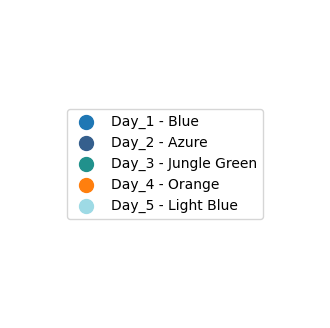

In [ ]:
def select_colors(num_colors):
    color_names = {
        "#fde725": "Lemon",
        "#bddf26": "Lime",
        "#7ad151": "Light Green",
        "#44bf70": "Green",
        "#22a884": "Shamrock",
        "#21918c": "Jungle Green",
        "#2a788e": "Sea Blue",
        "#355f8d": "Azure",
        "#414487": "Royal Blue",
        "#482475": "Purple",
        "#440154": "Blackcurrant",
        "#9edae5": "Light Blue",
        "#17becf": "Cyan",
        "#bcbd22": "Olive",
        "#7f7f7f": "Grey",
        "#e377c2": "Pink",
        "#8c564b": "Brown",
        "#9467bd": "Lavender",
        "#d62728": "Red",
        "#2ca02c": "Green",
        "#ff7f0e": "Orange",
        "#1f77b4": "Blue"
    }
    if num_colors <= len(color_names):
        selected_colors = random.sample(list(color_names.keys()), num_colors)
        return {color: color_names[color] for color in selected_colors}
    else:
        print("Number of colors requested exceeds the available colors.")
        return {}

def get_hexcodelist():
    # Extract list of hex codes
    return list(selected_colors.keys())

def hex_to_name(hex_code):
    color_names = {
        "#fde725": "Lemon",
        "#bddf26": "Lime",
        "#7ad151": "Light Green",
        "#44bf70": "Green",
        "#22a884": "Shamrock",
        "#21918c": "Jungle Green",
        "#2a788e": "Sea Blue",
        "#355f8d": "Azure",
        "#414487": "Royal Blue",
        "#482475": "Purple",
        "#440154": "Blackcurrant",
        "#9edae5": "Light Blue",
        "#17becf": "Cyan",
        "#bcbd22": "Olive",
        "#7f7f7f": "Grey",
        "#e377c2": "Pink",
        "#8c564b": "Brown",
        "#9467bd": "Lavender",
        "#d62728": "Red",
        "#2ca02c": "Green",
        "#ff7f0e": "Orange",
        "#1f77b4": "Blue"
    }
    return color_names.get(hex_code.lower(), "Unknown Color")





# Count the number of CSV files
csv_files = glob.glob(folder_path + "/*.csv")
csv_count = len(csv_files)

print("Number of CSV files in the folder:", csv_count)


# Example usage:
selected_colors = select_colors(csv_count)
# print(selected_colors)

# Extract list of hex codes
hex_codes_list = list(selected_colors.keys())
# print(hex_codes_list)


plt.figure(figsize=(4, 4))
for i, code in enumerate(hex_codes_list):
    color_name = hex_to_name(code)
    # plt.scatter([i], [0], c=code, s=120)
    colorhexnames.append(color_name)
    plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")
    print(f"Day_{i+1} color {code}: {color_name}")

# plt.legend()
plt.legend(loc='center')
plt.axis('off')

# plt.savefig('/content/drive/MyDrive/Cyclones/mawar/direction_fig/wind_speed_colors.png', dpi=100)
plt.savefig('/content/drive/MyDrive/Cyclones/{}/direction_fig/wind_speed_colors.png'.format(word), dpi=100)

plt.show()


In [ ]:
print(colorhexnames)

['Olive', 'Azure', 'Orange', 'Red', 'Green', 'Green', 'Royal Blue', 'Light Blue', 'Lime', 'Pink', 'Brown', 'Lavender', 'Lime', 'Orange', 'Red', 'Brown', 'Green', 'Lemon', 'Purple', 'Blackcurrant', 'Sea Blue', 'Pink', 'Light Blue', 'Cyan', 'Purple', 'Olive', 'Light Green', 'Royal Blue', 'Sea Blue', 'Red', 'Green', 'Jungle Green', 'Lemon', 'Green', 'Light Blue', 'Red', 'Pink', 'Green', 'Blue', 'Shamrock', 'Blackcurrant', 'Sea Blue', 'Lemon', 'Lavender', 'Light Green', 'Red', 'Olive', 'Cyan', 'Orange', 'Brown', 'Green', 'Purple', 'Pink', 'Blue', 'Jungle Green']


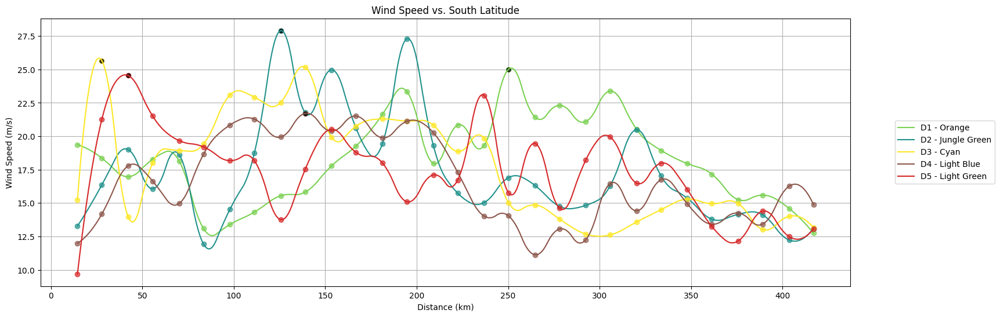

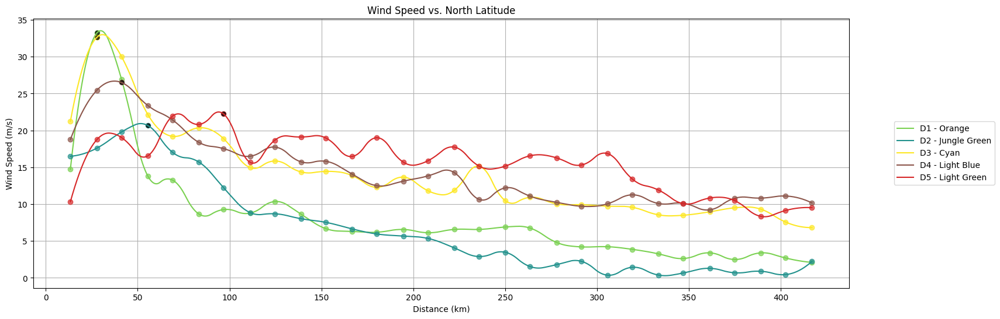

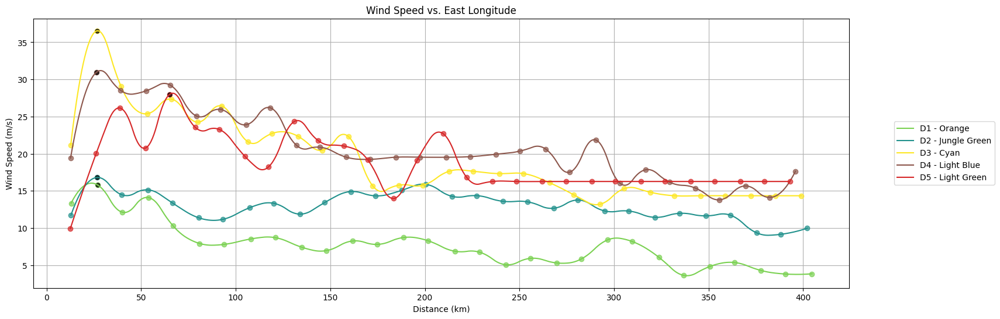

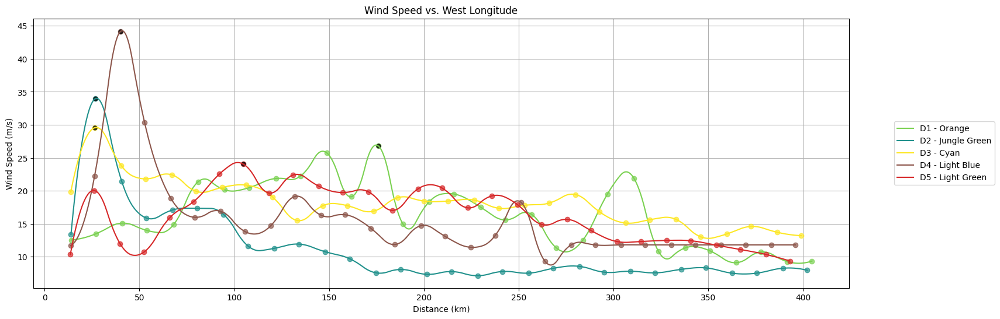

In [ ]:
def plot_wind_speed_direction(data, direction_label, coordinate_label, coordinate_data, coordinate_name, distance_data, colors, xlim=None):
    # color_names = [mcolors.to_hex(color) for color in colors]
        # plt.plot([], [], c=code, label=f"D{i+1} - {colorhexnames[i]}")

        # direction_data = data[data["Direction"] == direction_label]
        # coordinate = direction_data[coordinate_data]
        # distance = direction_data[distance_data]
        # wind_speed = direction_data["WindSpeed"]
    plt.figure(figsize=(18, 6))
    for i, code in enumerate(colors):
        # Print color information
        plt.plot([], [], c=code, label=f"D{i+1} - {colorhexnames[i]}")
        # print(f"Day_{i+1} color {code}: {color_name}")

    for i, color in enumerate(colors):


        direction_data = data[i][data[i]["Direction"] == direction_label]
        coordinate = direction_data[coordinate_data]
        distance = direction_data[distance_data]
        wind_speed = direction_data["WindSpeed"]

        clean_indices = np.logical_and((coordinate >= min(coordinate) - 2 * np.std(coordinate)),
                                       (coordinate <= max(coordinate) + 2 * np.std(coordinate)))
        clean_indices &= np.logical_and((wind_speed >= min(wind_speed) - 2 * np.std(wind_speed)),
                                        (wind_speed <= max(wind_speed) + 2 * np.std(wind_speed)))
        coordinate = coordinate[clean_indices]
        distance = distance[clean_indices]
        wind_speed = wind_speed[clean_indices]

        sorted_indices = np.argsort(distance)
        coordinate = coordinate.iloc[sorted_indices]
        distance = distance.iloc[sorted_indices]
        wind_speed = wind_speed.iloc[sorted_indices]

        # Plot data points
        plt.plot(distance, wind_speed, 'o', color=color, alpha=0.7)  # Plot against distance

        # plt.plot(distance, wind_speed, 'o', label=f"Dataset {i + 1}", alpha=0.7)

        # Find the index of the maximum wind speed
        max_wind_speed_index = np.argmax(wind_speed)
        # Plot the maximum wind speed point in green = 'go' such as 'r' for red, 'b' for blue, 'c' for cyan, etc.,
        # or you can specify colors using their RGB or RGBA values. For example, 'r' for red, 'b' for blue, and 'k' for black are some common color abbreviations.
        # 'k.'
        plt.plot(distance.iloc[max_wind_speed_index], wind_speed.iloc[max_wind_speed_index], 'k.', markersize=10, alpha=0.7) #,label='Max {} (m/s) '.format(f"{np.max(wind_speed):.2f}")

        # cyclone_eye_label = "cyclone_eye({}, {})".format(eye_lat, eye_lon)
        # # constant_coordinate = 'constant_{}({})'.format(coordinate_name, eye_lat if coordinate_name == "lat" else eye_lon)
        # plt.plot([], [], 'o', label=cyclone_eye_label, color='black')
        # plt.plot([], [], ' ', label=constant_coordinate)  # Placeholder for additional label

        fitting_method = "spline"
        fit_degree = 2

        if fitting_method == "spline":
            spline_fit = UnivariateSpline(distance, wind_speed, k=fit_degree, s=0)
            spline_x = np.linspace(min(distance), max(distance), 1000)
            fit_curve = spline_fit(spline_x)

        plt.plot(spline_x, fit_curve, color=color)



    plt.xlabel("Distance (km)")
    plt.ylabel("Wind Speed (m/s)")
    plt.title(f"Wind Speed vs. {direction_label} {coordinate_label}")
    plt.grid(True)
    # plt.legend()
    plt.legend(bbox_to_anchor=(1.05, 0.5), loc='center left')
    # if xlim is not None:
    #     plt.xlim(xlim)


    # plt.savefig('/content/drive/MyDrive/Cyclones/mawar/graphs/wind_speed_distance_{}.png'.format(direction_label.lower()), dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/graphs/wind_speed_distance_{}.png'.format(direction_label.lower()), dpi=100)


    plt.show()



csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Read the CSV files
data = [pd.read_csv(os.path.join(folder_path, csv_file)) for csv_file in csv_files]

colors = get_hexcodelist()
# # Define colors for each dataset
# colors = ['red', 'blue']  # Add more colors if needed

# Plot for South Direction
plot_wind_speed_direction(data, "South", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

plot_wind_speed_direction(data, "North", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

plot_wind_speed_direction(data, "East", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

plot_wind_speed_direction(data, "West", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))


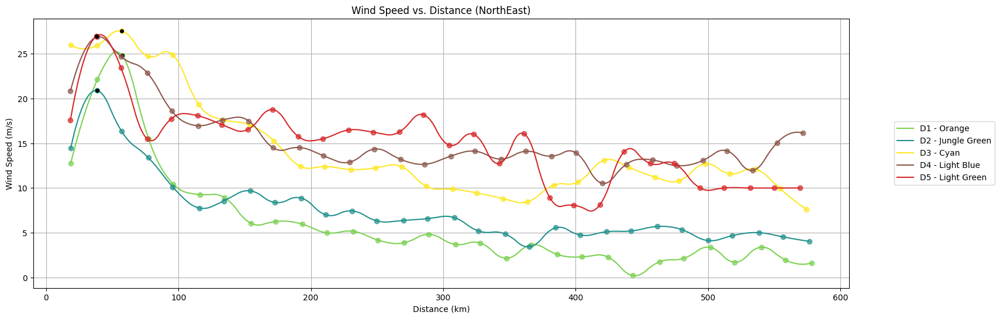

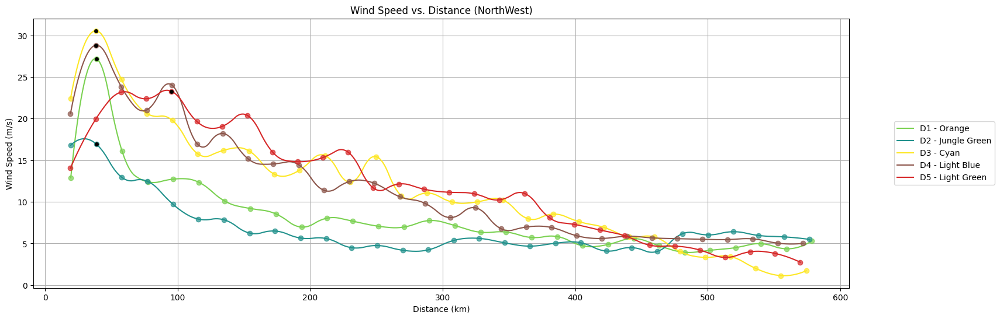

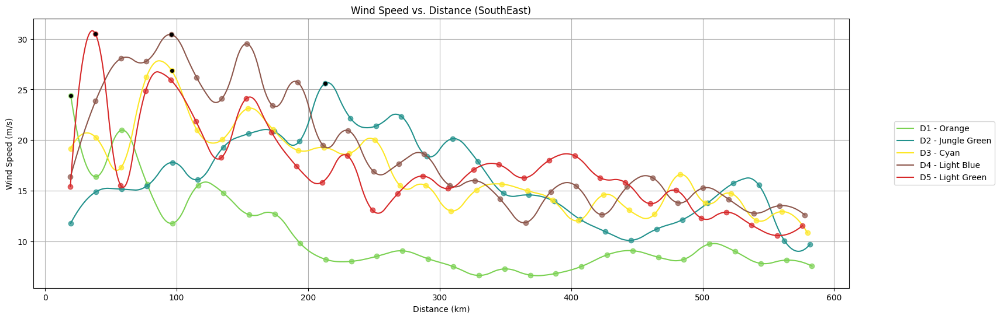

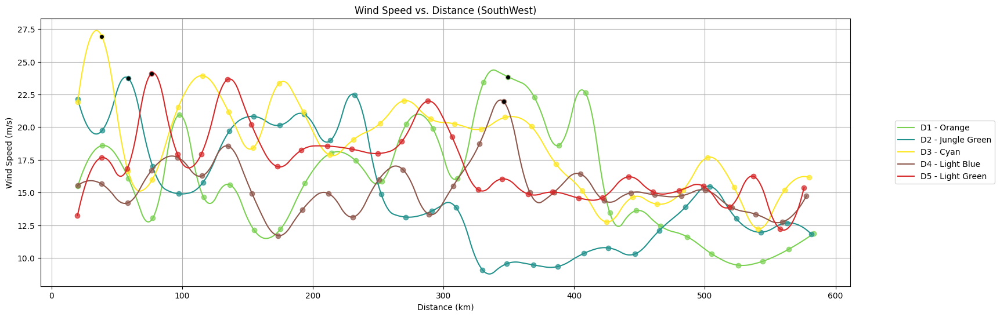

In [ ]:
# Define a function for plotting wind speed against distance for a given direction
def plot_wind_speed_direction(direction,  colors):
    # color_names = [mcolors.to_hex(color) for color in colors]
    plt.figure(figsize=(18, 6))
    for i, code in enumerate(colors):
        # Print color information
        plt.plot([], [], c=code, label=f"D{i+1} - {colorhexnames[i]}")
        # print(f"Day_{i+1} color {code}: {color_name}")

    for i, color in enumerate(colors):
        direction_data = data[i][data[i]["Direction"] == direction]

        distance = direction_data["Distance"]  # Assuming "Distance" is the column name for distance
        wind_speed = direction_data["WindSpeed"]

        plt.plot(distance, wind_speed, 'o', color=color, alpha=0.7)

        fitting_method = "spline"  # Options: "linear", "quadratic", "spline"
        fit_degree = 2  # Use 1 for linear, 2 for quadratic, higher for more complex curves

        if fitting_method == "spline":
            spline_fit_direction = UnivariateSpline(distance, wind_speed, k=fit_degree, s=0)

        distance_range = np.linspace(min(distance), max(distance), 1000)
        direction_fit = spline_fit_direction(distance_range)

        plt.plot(distance_range, direction_fit, '-', color=color)
        # plt.plot(distance, wind_speed, '-', color='blue')

        max_wind_speed_index = np.argmax(wind_speed)
        plt.plot(distance.iloc[max_wind_speed_index], wind_speed.iloc[max_wind_speed_index], 'k.', markersize=8)# label='Max {} (m/s) '.format(f"{np.max(wind_speed):.2f}"),

        # cyclone_eye_label = "cyclone_eye({}, {})".format(eye_lat,eye_lon)
        # plt.plot([], [], 'o', label=cyclone_eye_label, color='black')


    plt.xlabel("Distance (km)")
    plt.ylabel("Wind Speed (m/s)")
    plt.title(f"Wind Speed vs. Distance ({direction})")
    plt.grid(True)
    # plt.legend()
    plt.legend(bbox_to_anchor=(1.05, 0.5), loc='center left')


    # plt.savefig('/content/drive/MyDrive/Cyclones/mawar/graphs/wind_speed_distace_{}.png'.format(direction.lower()), dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/graphs/wind_speed_distace_{}.png'.format(direction.lower()), dpi=100)


    plt.show()



csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Read the CSV files
data = [pd.read_csv(os.path.join(folder_path, csv_file)) for csv_file in csv_files]

colors = get_hexcodelist()
# Plot for NorthEast
plot_wind_speed_direction("NorthEast", colors)

# Plot for NorthWest
plot_wind_speed_direction("NorthWest", colors)

# Plot for SouthEast
plot_wind_speed_direction("SouthEast", colors)

# Plot for SouthWest
plot_wind_speed_direction("SouthWest", colors)


# **Graphs and reports**

In [ ]:
# # Define a function for plotting wind speed against distance for a given direction
# def day_wise_details(direction,  colors):
#     for i, color in enumerate(colors):
#         direction_data = data[i][data[i]["Direction"] == direction]

#         distance = direction_data["Distance"]  # Assuming "Distance" is the column name for distance
#         wind_speed = direction_data["WindSpeed"]
max_wind_speed_dir_list=[]
max_wind_speed_dir = {}

def day_wise_details(data, direction_label): #, coordinate_label, coordinate_data, coordinate_name, distance_data, colors, xlim=None):
    # for i, color in enumerate(colors):
    # direction_data = data[i][data[i]["Direction"] == direction_label]
    direction_data = data[data["Direction"] == direction_label]
    # coordinate = direction_data[coordinate_data]
    # distance = direction_data[distance_data]
    wind_speed = direction_data["WindSpeed"]

    max_wind_speed_dir = {
        "direction": direction_label,
        "max_wind_speed": round(np.max(wind_speed), 2)
    }

    max_wind_speed_dir_list.append(max_wind_speed_dir)

    return round(np.max(wind_speed),2)



# folder_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
folder_path = '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones'


csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]


# pattern = r'(\d+)_([A-Za-z]{2})_'

# # Iterate through each CSV file
# for csv_file in csv_files:
#     # Extract numbers and letters from the file name using regular expressions
#     match = re.search(pattern, csv_file)

# for csv_file in csv_files:
#     # Read the CSV file
#     file_path = os.path.join(folder_path, csv_file)
#     data = pd.read_csv(file_path)


i=0

# with open('/content/drive/MyDrive/Cyclones/mawar/tables/day_wise_report.csv', 'a', newline='') as csvfile:
with open('/content/drive/MyDrive/Cyclones/biparjoy/tables/day_wise_report.csv', 'a', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Day', 'julian_day', 'Center_WS', 'North', 'South', 'West', 'East', 'NorthEast', 'SouthEast', 'NorthWest', 'SouthWest', 'Maxspeed', 'Direction'])

#day_wise_report.append('Day', 'julian_day', 'Center_WS', 'North', 'South', 'West', 'East', 'NorthEast', 'SouthEast', 'NorthWest', 'SouthWest')
# Iterate through each CSV file
for csv_file in csv_files:

    day_wise_report.clear()
    max_wind_speed_dir.clear()
    max_wind_speed_dir_list.clear()
    # Read the CSV file
    file_path = os.path.join(folder_path, csv_file)
    data = pd.read_csv(file_path)

    # Example file name
    file_name = file_path

    # Extracting characters using string manipulation
    parts = file_name.split('/')  # Splitting the file path by directory separators
    file_name = parts[-1]  # Extracting just the file name
    parts = file_name.split('_')  # Splitting the file name by underscores
    jday = parts[3]  # Extracting the part representing Julian day
    adp = parts[4].split('.')[0]  # Extracting the part representing direction without the extension

    # day_wise_report.append('File: {}'.format(csv_file))
    day_wise_report.append('Day_{}'.format(i+1))
    day_wise_report.append('{}_{}'.format(jday, adp))
    day_wise_report.append(wind_speed_cyclone_pass[i])

    day_wise_report.append(day_wise_details(data, "North"))
    day_wise_report.append(day_wise_details(data, "South"))
    day_wise_report.append(day_wise_details(data, "West"))
    day_wise_report.append(day_wise_details(data, "East"))
    day_wise_report.append(day_wise_details(data, "NorthEast"))
    day_wise_report.append(day_wise_details(data, "SouthEast"))
    day_wise_report.append(day_wise_details(data, "NorthWest"))
    day_wise_report.append(day_wise_details(data, "SouthWest"))

    # Find the dictionary with the highest max_wind_speed
    max_wind_speed_dict = max(max_wind_speed_dir_list, key=lambda x: x["max_wind_speed"])

    # Extract the direction and maximum wind speed
    highest_direction = max_wind_speed_dict["direction"]
    highest_max_wind_speed = max_wind_speed_dict["max_wind_speed"]

    day_wise_report.append(highest_max_wind_speed)
    day_wise_report.append(highest_direction)

    #print(max_wind_speed_dir_list)
    print(max_wind_speed_dict)


    # Print the day-wise report
    print(day_wise_report)

    i=i+1
    # Optionally, you can save the day-wise report to a CSV file
    # with open('/content/drive/MyDrive/Cyclones/mawar/tables/day_wise_report.csv', 'a', newline='') as csvfile:
    with open('/content/drive/MyDrive/Cyclones/{}/tables/day_wise_report.csv'.format(word), 'a', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # writer.writerow(['Day', 'julian_day', 'Center_WS', 'North', 'South', 'West', 'East', 'NorthEast', 'SouthEast', 'NorthWest', 'SouthWest'])
        writer.writerow(day_wise_report)
        # Save the wind speed data to a CSV file
    # with open('/content/drive/MyDrive/data/student_bhuvan_kandhi/table2/day_wise_report.csv', 'a', newline='') as csvfile:
    #     writer = csv.writer(csvfile)
    #     # if i == 1:  # Write header only in the first iteration
    #     writer.writerow(['Day', 'julian_day', 'Center_WS', 'North', 'South', 'West', 'East', 'NorthEast', 'SouthEast', 'NorthWest', 'SouthWest'])
    #     writer.writerow(day_wise_report)



{'direction': 'North', 'max_wind_speed': 33.23}
['Day_1', '157_NS', 11.11, 33.23, 25.01, 26.82, 15.79, 24.79, 24.42, 27.17, 23.85, 33.23, 'North']
{'direction': 'West', 'max_wind_speed': 33.96}
['Day_2', '159_NS', 10.4, 20.65, 27.91, 33.96, 16.8, 20.86, 25.6, 16.94, 23.74, 33.96, 'West']
{'direction': 'East', 'max_wind_speed': 36.54}
['Day_3', '161_NS', 10.17, 32.64, 25.66, 29.57, 36.54, 27.51, 26.85, 30.55, 26.95, 36.54, 'East']
{'direction': 'West', 'max_wind_speed': 44.17}
['Day_4', '162_NS', 8.95, 26.5, 21.71, 44.17, 30.97, 26.84, 30.43, 28.81, 21.95, 44.17, 'West']
{'direction': 'SouthEast', 'max_wind_speed': 30.5}
['Day_5', '163_NS', 7.76, 22.23, 24.54, 24.04, 27.97, 26.96, 30.5, 23.28, 24.1, 30.5, 'SouthEast']


In [ ]:
print(trackc_lats)
print(trackc_lons)

cyc_tracklats = list(trackc_lats)
cyc_tracklons = list(trackc_lons)
print(wind_speed_cyclone_pass)

[13.96, 15.31, 16.87, 18.29, 19.54]
[66.45, 64.04, 67.4, 67.75, 67.17]
[11.11, 10.4, 10.17, 8.95, 7.76]


# **Track global**

In [ ]:
#imd mawar

latitude_list_imd = [10.0, 12.20, 13.80, 14.30, 15.70, 16.40, 17.30, 19.70, 20.40, 22.70, 25.80]
longitude_list_imd = [146.90, 146.10, 144.70, 143.50, 136.50, 133.30, 128.70, 125.60, 125.10, 125.50, 127.10]

min_lat = 0.0  # Minimum latitude
max_lat = 35.0  # Maximum latitude
min_lon = 110.0  # Minimum longitude
max_lon = 170.0  # Maximum longitude

# #imd biparjoy

# latitude_list_imd = [12.1, 14.4, 17.1, 18.6, 19.6]
# longitude_list_imd = [66.0, 66.0 , 67.3, 67.7, 67.3]

# min_lat = 0.0  # Minimum latitude
# max_lat = 60.0  # Maximum latitude
# min_lon = 20.0  # Minimum longitude
# max_lon = 80.0  # Maximum longitude

# **Track Cyclone**

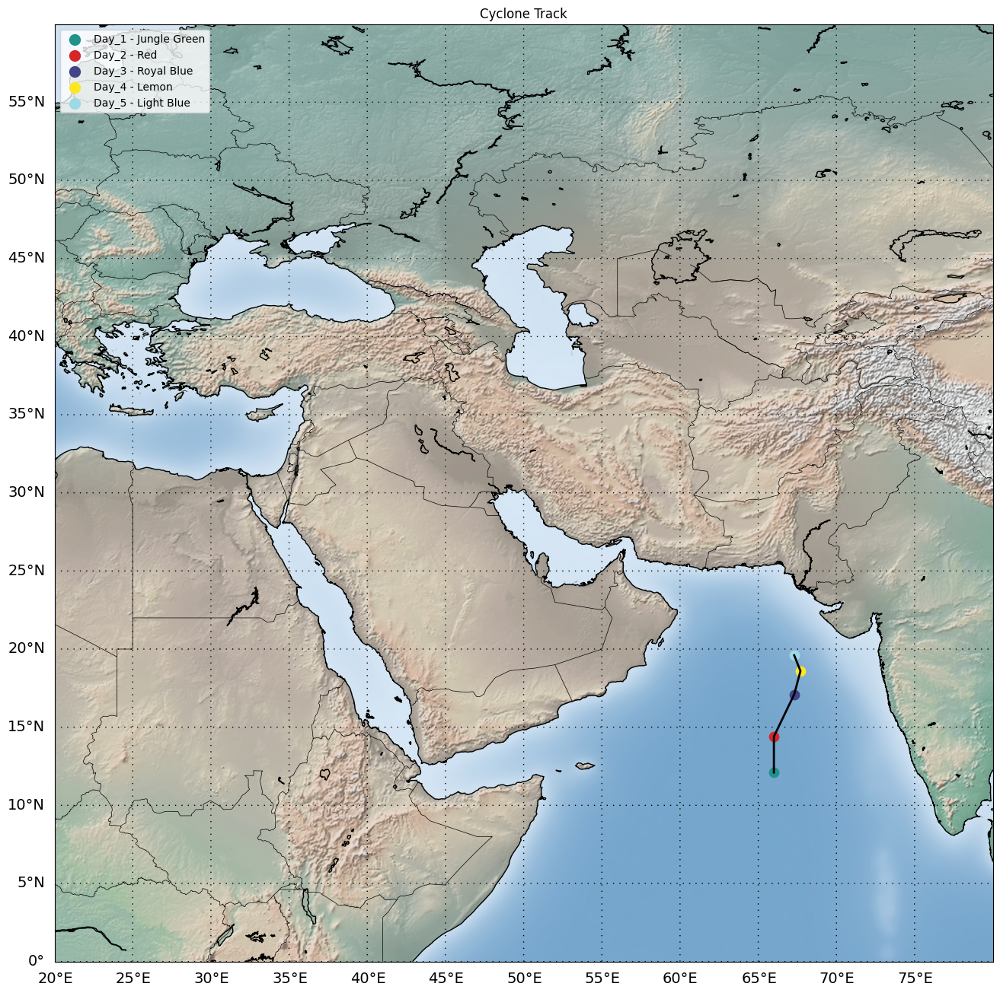

In [ ]:
def plot_track(trackc_lats, trackc_lons, colors):

    fig = plt.figure(figsize=(20, 16), facecolor='white')
    ax = fig.add_subplot(111)

    my_map = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map.drawcoastlines()
    my_map.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)
    meridians = np.arange(min_lon, max_lon, 5)
    my_map.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    plt.title('Cyclone Track')

    x1, y1 = my_map(trackc_lons, trackc_lats)

    for i, (x, y) in enumerate(zip(x1, y1)):
        my_map.scatter(x, y, c=colors[i], marker='o', s=80)

    for i, code in enumerate(hex_codes_list):
        color_name = hex_to_name(code)
        # plt.scatter([i], [0], c=code, s=120)
        colorhexnames.append(color_name)
        plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")

    my_map.plot(x1, y1, color='black', linewidth=2)
    my_map.shadedrelief()

    plt.legend(loc='upper left')

    # plt.savefig('/content/drive/MyDrive/Cyclones/mawar/direction_fig/track_cyclone.png', dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/{}/direction_fig/track_cyclone_imd_{}.png'.format(word, word), dpi=100)

    plt.show()
    plt.close()

colors = get_hexcodelist()
# Call the function
# plot_track(cyc_tracklats, cyc_tracklons, colors)

plot_track(latitude_list_imd ,longitude_list_imd, colors)

# **Track all Cyclones**

Binarization Data:
Latitude: [9.02, 10.62, 13.02, 14.68, 14.65, 15.4, 18.27, 19.35, 19.42, 22.07, 24.51]
Longitude: [147.15, 146.53, 145.73, 138.93, 139.7, 133.6, 127.0, 125.89, 126.81, 125.29, 126.83]
Wind Speeds: [11.39, 11.93, 12.99, 12.1, 13.66, 10.74, 8.91, 11.21, 10.35, 10.62, 11.32]
Relative Vorticity Data:
Latitude: [9.02, 10.87, 14.34, 14.68, 14.65, 16.0, 18.27, 19.35, 21.08, 22.07, 24.51]
Longitude: [147.15, 145.25, 143.45, 138.93, 139.7, 129.28, 127.0, 125.89, 124.9, 125.29, 126.83]
Wind Speeds: [11.39, 8.57, 10.41, 12.1, 13.66, 11.91, 8.91, 11.21, 12.52, 10.62, 11.32]
IMD :
Latitude: [10.0, 12.2, 13.8, 14.3, 15.7, 16.4, 17.3, 19.7, 20.4, 22.7, 25.8]
Longitude: [146.9, 146.1, 144.7, 143.5, 136.5, 133.3, 128.7, 125.6, 125.1, 125.5, 127.1]


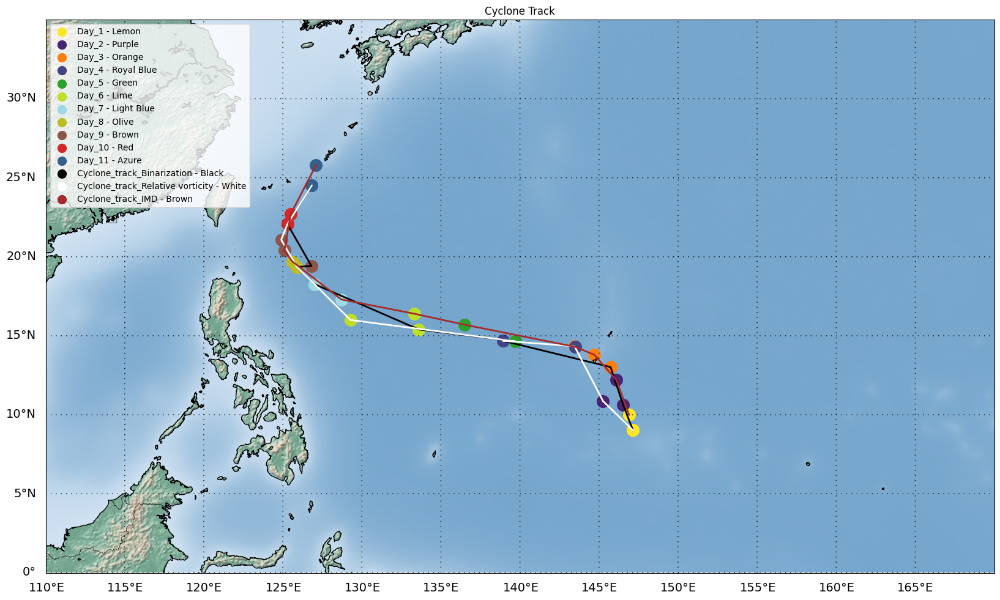

In [ ]:
def plot_track(trackc_lats_list, trackc_lons_list, colors, colors_list):
    fig = plt.figure(figsize=(20, 16), facecolor='white')
    ax = fig.add_subplot(111)

    my_map = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map.drawcoastlines()
    my_map.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)
    meridians = np.arange(min_lon, max_lon, 5)
    my_map.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    plt.title('Cyclone Track')
    for i, (trackc_lats, trackc_lons) in enumerate(zip(trackc_lats_list, trackc_lons_list)):
        x1, y1 = my_map(trackc_lons, trackc_lats)
        for j, (x, y) in enumerate(zip(x1, y1)):
            my_map.scatter(x, y, c=colors[j], marker='o', s=200)


    for i, (trackc_lats, trackc_lons, colors, colors_line) in enumerate(zip(trackc_lats_list, trackc_lons_list, colors ,colors_list)):
        x1, y1 = my_map(trackc_lons, trackc_lats)
        # for j, (x, y) in enumerate(zip(x1, y1)):
        #     my_map.scatter(x, y, c=colors[j], marker='o', s=80)
        my_map.plot(x1, y1, color=colors_line[0], linewidth=2)  # Use the first color for the line

    for i, code in enumerate(hex_codes_list):
        color_name = hex_to_name(code)
        # plt.scatter([i], [0], c=code, s=120)
        colorhexnames.append(color_name)
        plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")
    track_names = ["Binarization", "Relative vorticity", "IMD"]
    track_colors = ["Black", "White", "Brown"]
    for i, (colors_line) in enumerate(zip(colors_list)):
        plt.scatter([], [], c=track_colors[i], s=100, label=f"Cyclone_track_{track_names[i]} - {track_colors[i]}")

    my_map.shadedrelief()

    # Add legend for the lines
    # plt.legend(['First Line', 'Second Line'], loc='upper left')
    plt.legend(loc='upper left')
    # plt.savefig('/content/drive/MyDrive/Cyclones/mawar/direction_fig/track_cyclone_birv.png', dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/{}/direction_fig/track_cyclone_group_{}.png'.format(word, word), dpi=100)
    plt.show()
    plt.close()

def extract_data(csv_file_path):
    latitude_list = []
    longitude_list = []
    wind_speeds = []

    try:
        with open(csv_file_path, 'r') as file:
            csv_reader = csv.DictReader(file)
            for row in csv_reader:
                latitude_list.append(float(row.get('Latitude_center', 0)))
                longitude_list.append(float(row.get('Longitude_center', 0)))
                wind_speeds.append(float(row.get('Windspeed', 0)))
    except FileNotFoundError:
        print(f"File not found: {csv_file_path}")
    except KeyError as e:
        print(f"Key not found in CSV file: {e}")

    return latitude_list, longitude_list, wind_speeds

# csv_file_path_bi = '/content/drive/MyDrive/Cyclones_methods/binarization/mawar/tables/vertocity.csv'
csv_file_path_bi = '/content/drive/MyDrive/Cyclones_methods/binarization/{}/tables/vertocity.csv'.format(word)

latitude_list_bi, longitude_list_bi, wind_speeds_bi = extract_data(csv_file_path_bi)

# csv_file_path_rv = '/content/drive/MyDrive/Cyclones_methods/relative_vorticity/mawar/tables/vertocity_cenetr.csv'
csv_file_path_rv = '/content/drive/MyDrive/Cyclones_methods/relative_vorticity/{}/tables/vertocity_cenetr.csv'.format(word)

latitude_list_rv, longitude_list_rv, wind_speeds_rv = extract_data(csv_file_path_rv)



print("Binarization Data:")
print("Latitude:", latitude_list_bi)
print("Longitude:", longitude_list_bi)
print("Wind Speeds:", wind_speeds_bi)

print("Relative Vorticity Data:")
print("Latitude:", latitude_list_rv)
print("Longitude:", longitude_list_rv)
print("Wind Speeds:", wind_speeds_rv)

print("IMD :")
print("Latitude:", latitude_list_imd)
print("Longitude:", longitude_list_imd)

colors = get_hexcodelist()
# Assuming you have multiple sets of latitude and longitude
plot_track([latitude_list_bi, latitude_list_rv ,latitude_list_imd], [longitude_list_bi, longitude_list_rv, longitude_list_imd], colors, [['black'] * len(latitude_list_bi), ['white'] * len(latitude_list_rv), ['brown'] * len(latitude_list_imd)])


# **Cyclones distances**

In [ ]:
csv_file_path_bi = '/content/drive/MyDrive/Cyclones_methods/binarization/{}/tables/vertocity.csv'.format(word)
csv_file_path_rv = '/content/drive/MyDrive/Cyclones_methods/relative_vorticity/{}/tables/vertocity_cenetr.csv'.format(word)

latitude_list_bi, longitude_list_bi, wind_speeds_bi = extract_data(csv_file_path_bi)
latitude_list_rv, longitude_list_rv, wind_speeds_rv = extract_data(csv_file_path_rv)

# latitude_list_imd

# longitude_list_imd


def calculate_distances(latitude_list_imd, longitude_list_imd, latitude_list_bi, longitude_list_bi, latitude_list_rv, longitude_list_rv):
    distances = []
    i=1

    for index, (imd_lat, imd_lon) in enumerate(zip(latitude_list_imd, longitude_list_imd)):
        imd_to_bi = haversine(imd_lon, imd_lat, longitude_list_bi[index], latitude_list_bi[index])
        imd_to_rv = haversine(imd_lon, imd_lat, longitude_list_rv[index], latitude_list_rv[index])
        distances.append(['Day_{}_{{{}, {} }}'.format(i, imd_lat, imd_lon),
                          'Day_{}_{{{}, {} }}_( {} )'.format(i, latitude_list_bi[index], longitude_list_bi[index], imd_to_bi),
                          'Day_{}_{{{}, {} }}_( {} )'.format(i, latitude_list_rv[index], longitude_list_rv[index], imd_to_rv)])
        i += 1
    return distances

# Calculate distances
distances = calculate_distances(latitude_list_imd, longitude_list_imd,
                                 latitude_list_bi, longitude_list_bi,
                                 latitude_list_rv, longitude_list_rv)

# Write distances to CSV
with open('/content/drive/MyDrive/Cyclones_methods/distances_{}.csv'.format(word), 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['IMD', 'IMD_to_BI', 'IMD_to_RV'])
    for row in distances:
        csvwriter.writerow(row)

# print(distances)

In [ ]:

    # # Find the indices of the minimum and maximum values in each quadrant

    # print(masked_lats[mslat+min_row, mslon+min_col], masked_lons[mslat+min_row, mslon+min_col])
    # # QUAD-1
    # quad1_mean = np.nanmean(top_left)
    # top_left_min_index = np.unravel_index(np.nanargmin(top_left), top_left.shape)
    # q11, k11, k12 = masked_wind_speed[mslat + min_row +top_left_min_index[0], mslon + min_col +top_left_min_index[1]] , mslat + min_row +top_left_min_index[0], mslon + min_col +top_left_min_index[1]
    # # top_left[top_left == 50.0] = 0.0
    # top_left_max_index = np.unravel_index(np.nanargmax(top_left), top_left.shape)
    # mq11, mk11, mk12 = masked_wind_speed[mslat + min_row +top_left_max_index[0], mslon + min_col +top_left_max_index[1]] , mslat + min_row +top_left_max_index[0], mslon + min_col +top_left_max_index[1]
    # print("quad1-NW")
    # # print(quad_lat1, quad_lon1)
    # print(q11, masked_lats[k11][k12], masked_lons[k11][k12])

    # # QUAD-2
    # quad2_mean = np.nanmean(top_right)
    # top_right_min_index = np.unravel_index(np.nanargmin(top_right), top_right.shape)
    # q22, k22, k21 = masked_wind_speed[mslat + min_row +top_right_min_index[0], mslon + min_col +top_right_min_index[1]] , mslat + min_row +top_right_min_index[0], mslon + min_col +top_right_min_index[1]
    # top_right[top_right == 50.0] = 0.0
    # top_right_max_index = np.unravel_index(np.nanargmax(top_right), top_right.shape)
    # mq22, mk22, mk21 = masked_wind_speed[mslat + min_row +top_right_max_index[0], mslon + min_col +top_right_max_index[1]] , mslat + min_row +top_right_max_index[0], mslon + min_col +top_right_max_index[1]
    # print("quad2-NE")
    # # print(quad_lat2, quad_lon2)
    # print(q22, masked_lats[k22][k21], masked_lons[k22][k21])


    # # QUAD-3
    # quad3_mean = np.nanmean(bottom_left)
    # bottom_left_min_index = np.unravel_index(np.nanargmin(bottom_left), bottom_left.shape)
    # q33, k33, k32 = masked_wind_speed[mslat + min_row +bottom_left_min_index[0], mslon + min_col +bottom_left_min_index[1]] , mslat + min_row +bottom_left_min_index[0], mslon + min_col +bottom_left_min_index[1]
    # bottom_left[bottom_left == 50.0] = 0.0
    # bottom_left_max_index = np.unravel_index(np.nanargmax(bottom_left), bottom_left.shape)
    # mq33, mk33, mk32 = masked_wind_speed[mslat + min_row +bottom_left_max_index[0], mslon + min_col +bottom_left_max_index[1]] , mslat + min_row +bottom_left_max_index[0], mslon + min_col +bottom_left_max_index[1]
    # print("quad3-SE")
    # # print(quad_lat3, quad_lon3)
    # print(q33, masked_lats[k33][k32], masked_lons[k33][k32])

    # # QUAD-4
    # quad4_mean = np.nanmean(bottom_right)
    # bottom_right_min_index = np.unravel_index(np.nanargmin(bottom_right), bottom_right.shape)
    # q44, k44, k42 = masked_wind_speed[mslat + min_row +bottom_right_min_index[0], mslon + min_col +bottom_right_min_index[1]] , mslat + min_row +bottom_right_min_index[0], mslon + min_col +bottom_right_min_index[1]
    # bottom_right[bottom_right == 50.0] = 0.0
    # bottom_right_max_index = np.unravel_index(np.nanargmax(bottom_right), bottom_right.shape)
    # mq44, mk44, mk42 = masked_wind_speed[mslat + min_row +bottom_right_max_index[0], mslon + min_col +bottom_right_max_index[1]] , mslat + min_row +bottom_right_max_index[0], mslon + min_col +bottom_right_max_index[1]
    # print("quad4-SW")
    # # print(quad_lat4, quad_lon4)
    # print(q44, masked_lats[k44][k42], masked_lons[k44][k42])

    # print(masked_lats[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+min_col])
    # print(masked_lats[mslat+max_row, mslon+max_col], masked_lons[mslat+max_row, mslon+max_col])
    # print(masked_lats[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col])
    # print(masked_lats[mslat+min_row, mslon+min_col], masked_lons[mslat+min_row, mslon+min_col])


    # wind_lat = [masked_lats[mslat+max_row, mslon+min_col], masked_lats[mslat+max_row, mslon+max_col], masked_lats[mslat+min_row, mslon+max_col], masked_lats[mslat+min_row, mslon+min_col]]
    # wind_lon = [masked_lons[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+min_col]]

## **practise**

Matrix has been saved to /content/drive/MyDrive/Cyclones/biparjoy/matrix.csv
468 106 508 143
(23.77, 68, 58)
[578, 578, 578, 578, 578] [104, 104, 104, 104, 104]
17.28 64.26
16.25 68.46
20.51 69.68
21.59 65.38
Wind speeds between 17.0 and 17.9: [17.64, 17.32, 17.4, 17.05, 17.7, 17.7, 17.6, 17.73, 17.25, 17.82, 17.92, 17.96, 17.07, 17.67, 17.79, 17.92, 17.56, 17.3, 17.84, 17.91, 17.36, 17.15, 17.71, 17.73, 17.07, 17.72, 17.97, 17.89, 17.54, 17.02, 17.51, 17.05, 17.33, 17.52, 17.89, 17.73, 17.5, 17.68, 17.95, 17.44, 17.92, 17.53, 17.54, 17.51, 17.21, 17.84, 17.25, 17.7, 17.6, 17.12, 17.73, 17.75, 17.66, 17.02, 17.43, 17.38, 17.2, 17.07, 17.19, 17.73, 17.63, 17.24, 17.79, 17.07, 17.62, 17.38, 17.74, 17.6, 17.31, 17.66, 17.47, 17.95, 17.33, 17.07, 17.46, 17.34, 17.67, 17.99, 17.58, 17.95, 17.72, 17.31, 17.39, 17.39, 17.54, 17.49, 17.32, 17.92, 17.7, 17.36, 17.05, 17.92, 17.87, 17.11, 17.17, 17.51, 17.44, 17.07, 17.77, 17.51, 17.71, 17.03, 17.37, 17.37, 17.61, 17.27, 17.19, 17.7, 17.19, 17.5

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


QUAD-1:  {'R34': '232.44', 'R50': '73.29', 'R64': 'nan'}
QUAD-2:  {'R34': '168.27', 'R50': '77.82', 'R64': '55.61'}
QUAD-3:  {'R34': '236.78', 'R50': '161.53', 'R64': 'nan'}
QUAD-4:  {'R34': '232.44', 'R50': '161.53', 'R64': 'nan'}
Wind speed data saved to '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones'
7.76 19.54 67.17
33.13 19.49 67.48
Max Wind speed with lat and lon(19.49, 67.48) this at (624, 121) and the max speed is 33.13 m/s in direction of SE
Min Wind speed with lat and lon(19.54, 67.17) this at (627, 125) and the max speed is 7.76 m/s
7.76 19.54 67.17
[21.19, 21.19, 18.79, 18.79, 21.19]
[65.61, 68.01, 68.01, 65.61, 65.61]


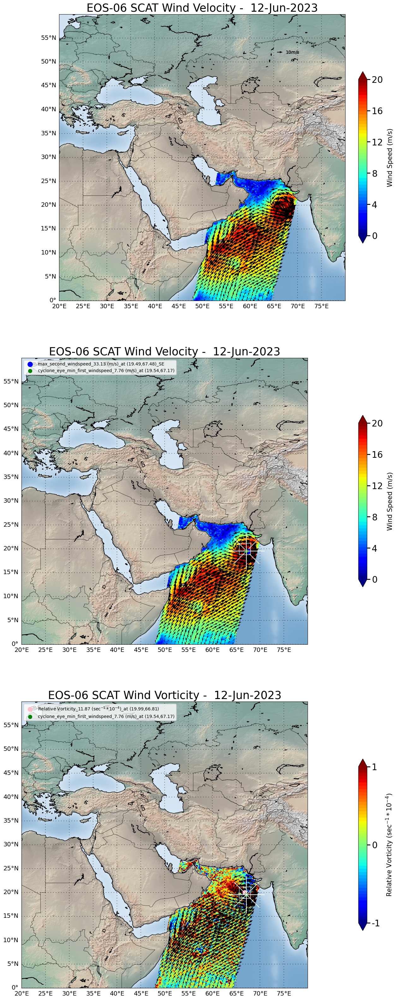

In [ ]:
def plotting_binarization(file_path):
    year, julian_day = re.findall(r'(\d{4})(\d{3})_', file_path)[0]
    #print(julian_day, year)
    mon, fdate, d2 = gregorian_date_from_julian_day(int(year), int(julian_day))
    # Extracting NS or SN
    adpass = re.findall(r'_(\w{2})_\d{2}km_', file_path)[0]
    a = 7

    #colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
    colorbar_ticks = [0, 4, 8, 12, 16, 20]
    colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels were these lables genuine if so then how was it decided

    levels = np.linspace(0.0, 20)


    #colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
    color_ticks = [-24, -16, -8, 0, 8, 16, 24]
    color_labels = ['-24','-16', '-8', '0', '8', '16', '24']  # Corresponding labels were these lables genuine if so then how was it decided

    levels = np.linspace(-20, 20)


    # Read data from HDF5 file
    with h5py.File(file_path, 'r') as f:
      LATITUDE_25 = f['/science_data/Latitude'][:]
      LONGITUDE_25 = f['/science_data/Longitude'][:]
      ws = f['/science_data/Wind_speed_selection'][:]
      wd = f['/science_data/Wind_direction_selection'][:]

      # Data processing
      LATITUDE_25 = LATITUDE_25.astype(float) / 100
      LONGITUDE_25 = LONGITUDE_25.astype(float) / 100
      wd = wd.astype(float) / 100
      ws = ws.astype(float) / 100
      LATITUDE_25[LATITUDE_25 == 327.67] = np.nan
      LONGITUDE_25[LONGITUDE_25 == 655.35] = np.nan
      ws[ws == 327.67] = np.nan
      wd[wd == 655.35] = np.nan

      lat = LATITUDE_25
      lon = LONGITUDE_25
      u = ws * np.cos(np.radians(wd))
      v = ws * np.sin(np.radians(wd))
      #u = ws * np.cos(np.deg2rad(wd))
      #v = ws * np.sin(np.deg2rad(wd))
      # Plotting Wind
      # wind_cal_speed = np.array(ws)
      wind_speed_matrix = np.array(ws)
      zonal_wind_speed_matrix = np.array(u)
      meridional_wind_speed_matrix = np.array(v)


      # print(wind_cal_speed.shape)
      # Replace 'lats' and 'lons' with your latitude and longitude arrays corresponding to the wind speed matrix
      lats = np.array(lat)
      lons = np.array(lon)

      # Create masked arrays to handle NaN values in the wind speed, latitude, and longitude arrays
      # masked_wind_cal_speed = np.ma.masked_invalid(wind_cal_speed)
      masked_wind_speed = np.ma.masked_invalid(wind_speed_matrix)
      masked_lats = np.ma.masked_invalid(lats)
      masked_lons = np.ma.masked_invalid(lons)
      masked_zonal_wind_speed = np.ma.masked_invalid(zonal_wind_speed_matrix)
      masked_meridional_wind_speed = np.ma.masked_invalid(meridional_wind_speed_matrix)

      mmasked_zonal_wind_speed = np.ma.masked_invalid(np.array(ws * np.sin(np.radians(wd))))
      mmasked_meridional_wind_speed = np.ma.masked_invalid(np.array(ws * np.cos(np.radians(wd))))
      # scatterometer wind data (u and v components)
      # Replace these arrays with your actual wind data
      res = 0.125
      DY = res * 6370e3 * 2 * np.pi / 360 * np.ones_like(lat)  # Assuming constant grid spacing in latitude
      DX = DY * np.cos(np.deg2rad(lat))  # Grid spacing in longitude depends on latitude

      u_x = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
      u_y = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
      u_x[1:-1, 1:-1] = u
      u_y[1:-1, 1:-1] = v

      u_x[0, :] = u_x[-2, :]
      u_x[-1, :] = u_x[1, :]
      u_x[:, 0] = u_x[:, -2]
      u_x[:, -1] = u_x[:, 1]
      u_y[0, :] = u_y[-2, :]
      u_y[-1, :] = u_y[1, :]
      u_y[:, 0] = u_y[:, -2]
      u_y[:, -1] = u_y[:, 1]

      wca1 = u_y[2:, 1:-1] - u_y[:-2, 1:-1]
      wca2 = u_x[1:-1, 2:] - u_x[1:-1, :-2]

      vorticity = (wca1) / (2 * DX) - (wca2) / (2 * DY)
      vorticity[vorticity == 0] = np.nan
      vorticity = vorticity * 10**4

      #levels = np.linspace(0.0, 20)

      #levels = [0,4,9,14,16,20,26,30]
      #levels = np.concatenate(([0,1,5],[1,10,10],[10,20,10]))

      # # Define the latitude and longitude bounds

      # #mawar
      # min_lat = 0.0  # Minimum latitude
      # max_lat = 35.0  # Maximum latitude
      # min_lon = 110.0  # Minimum longitude
      # max_lon = 170.0  # Maximum longitude

      ### biparjoy
      min_lat = 0.0  # Minimum latitude
      max_lat = 60.0  # Maximum latitude
      min_lon = 20.0  # Minimum longitude
      max_lon = 80.0  # Maximum longitude

      wlat = [max_lat, max_lat, min_lat, min_lat, max_lat]
      wlon = [min_lon, max_lon, max_lon, min_lon, min_lon]
      #----------------------------------------------------------------------------------------------------------------------------
      #----------------------------------------------------------------------------------------------------------------------------
      #----------------------------------------------------------------------------------------------------------------------------

      # Example 2D matrix
      matrix, vmatrix, mslat, mslon ,mslat1, mslon2= cal_sub(wlat, wlon, masked_lats, masked_lons, masked_wind_speed, vorticity)



      # Write the matrix to the CSV file
      with open(filename, 'w', newline='') as csvfile:
          csvwriter = csv.writer(csvfile)
          csvwriter.writerows(matrix)

      print("Matrix has been saved to", filename)


      # # Example 2D matrix
      # matrix, mslat, mslon = cal_sub(wlat, wlon)
      # print(mslat, mslon)
      # print(masked_lats.shape)
      # print(matrix.shape)
      threshold = 17.6

      # Binarize the image
      binarized_image = binarize_image(matrix, threshold)

      # extracting largest group of ones
      largest_group_of_ones, bi_indices , lar_grp = extract_largest_group_of_ones(binarized_image)

      # if largest_group_of_ones is None:
          # print("No largest group of ones found.")


      # group_of_ones = extract_group_of_ones(largest_group_of_ones)

      indices = extract_largest_group_of_onesss(largest_group_of_ones)


      # Now you can create a new matrix using these indices
      cycb = np.zeros_like(matrix)
      for idx in extract_largest_group_of_onesss(binarized_image):
          cycb[tuple(idx)] = matrix[tuple(idx)]

      # Now you can create a new matrix using these indices
      cycbione = np.zeros_like(largest_group_of_ones)
      # Find the minimum and maximum row and column indices
      min_row, min_col = np.min(bi_indices, axis=0)
      max_row, max_col = np.max(bi_indices, axis=0)

      print(min_row, min_col, max_row, max_col)


      evlan = [max_row, max_row, min_row, min_row, max_row]
      evlon = [min_col, max_col, max_col, min_col, min_col]



      # Modify indices if any of the indices have masked values
      modified_evlan, modified_evlon = modify_indices_if_masked(masked_lats, evlan, evlon)

      print(cal_min(modified_evlan, modified_evlon, masked_lats, masked_lons, masked_wind_speed))
      # print(cal_max(modified_evlan, modified_evlon))
      # print(evlan, evlon)
      print(modified_evlan, modified_evlon)
      # for row, col in zip(modified_evlan, modified_evlon):
      #         print(masked_lats[mslat+row, mslon+col])
      #         print(masked_lons[mslat+row, mslon+col])
      # print(max_row, min_col)
      # print(min_row, min_col, max_row, max_col)

      # print(matrix[max_row, min_col])
      print(masked_lats[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+min_col])
      print(masked_lats[mslat+max_row, mslon+max_col], masked_lons[mslat+max_row, mslon+max_col])
      print(masked_lats[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col])
      print(masked_lats[mslat+min_row, mslon+min_col], masked_lons[mslat+min_row, mslon+min_col])
      # print(masked_wind_speed[min_row, min_col])

      # if masked_lats[min_row, min_col] is np.ma.masked:
      #     ma= find_nearest_non_masked_value(masked_lats, min_row, min_col)
      #     print(masked_lats[ma[0], ma[1]] , ma)
      #     print("The value is masked.")


      cyc_matrix = matrix[min_row:max_row+1, min_col:max_col+1]
      vorti_matrix = vmatrix[min_row:max_row+1, min_col:max_col+1]
      # # Extract the group of 1's
      # group_of_ones = largest_group[min_row:max_row+1, min_col:max_col+1]
      for idx in indices:
          cycbione[tuple(idx)] = cyc_matrix[tuple(idx)]
      # matrix_array = np.array(matrix)

      values = cycbione.flatten()
      non_zero_indices = np.argwhere(values != 0).flatten()  # Indices of non-zero values

      # Check if there are any elements left after removal
      if len(non_zero_indices) == 0:
          min_index = None
          max_index = None
          min_value = None
          max_value = None
      else:
          # Find the index of the minimum value among non-zero elements
          min_index = non_zero_indices[np.argmin(values[non_zero_indices])]
          # Find the index of the maximum value among non-zero elements
          max_index = non_zero_indices[np.argmax(values[non_zero_indices])]
          # Get the minimum and maximum values
          min_value = values[min_index]
          max_value = values[max_index]

      # Find the index of the maximum value within the subset_matrix
      max_index = np.unravel_index(max_index, cycbione.shape)

      lat_diff = np.abs(masked_lats - masked_lats[max_row, min_col])
      lon_diff = np.abs(masked_lons - masked_lons[max_row, min_col])

      # Find the index where the sum of differences is minimized
      total_diff = lat_diff + lon_diff

      cdindex = np.unravel_index(total_diff.argmin(), total_diff.shape)

      cycbitwo = np.copy(cycbione)
      zeroes_counts = [count_zeroes(row, i, cycbitwo, cyc_matrix) for i, row in enumerate(cycbitwo)]


      cycbitwo[cycbitwo == 0] = np.nan


      minbi = np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape)
      maxbi = np.unravel_index(np.nanargmax(cycbione), cycbione.shape)

      # Count the occurrences of wind speeds equal to 17.5
      mask1 = (cycbitwo >= 17.0) & (cycbitwo < 18.0)

      # Add the wind speeds to list R34
      R34 = cycbitwo[mask1].tolist()

      # Print R34
      print("Wind speeds between 17.0 and 17.9:", R34)

      print("Count of wind speeds equal to 17.5:", np.count_nonzero(cycbitwo == 17.5))

      # Count the occurrences of wind speeds equal to 17.5
      mask2 = (cycbitwo >= 25.0) & (cycbitwo < 26.0)

      # Add the wind speeds to list R34
      R50 = cycbitwo[mask2].tolist()

      # Print R50
      print("Wind speeds between 25.0 and 25.9:", R50)

      print("Count of wind speeds equal to 25.7:", np.count_nonzero(cycbitwo == 25.7))

      # Count the occurrences of wind speeds equal to 17.5
      mask3 = (cycbitwo >= 32.0) & (cycbitwo < 33.0)

      # Add the wind speeds to list R34
      R64 = cycbitwo[mask3].tolist()

      # Print R64
      print("Wind speeds between 32.0 and 32.9:", R64)

      print("Count of wind speeds equal to 32.9:", np.count_nonzero(cycbitwo == 32.9))

      print("----------------------------------")

      maxvbi = np.unravel_index(np.nanargmax(vorti_matrix), vorti_matrix.shape)

      # Return the wind speed at the maximum value index

      # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)
      wind_speed_v = vorti_matrix[maxvbi[0], maxvbi[1]]

      print("Relative Vorticity : ", f"{wind_speed_v:.2f}")

      print(vorticity[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lats[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lons[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]])

      # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], min_row+cdindex[0]+minbi[0], min_col+cdindex[1]+minbi[1])

      # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lats[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lons[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]])

      print("----------------------------------")


      print("----------------------------------")

      lon_diff = np.abs(masked_wind_speed - masked_wind_speed[max_row, min_col])

      # Find the index where the sum of differences is minimized
      total_diff = lat_diff + lon_diff

      cdindex = np.unravel_index(total_diff.argmin(), total_diff.shape)


    #-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

      cycbitwo = np.copy(cycbione)
      zeroes_counts = [count_zeroes(row, i, cycbitwo, cyc_matrix) for i, row in enumerate(cycbitwo)]


      cycbitwo[cycbitwo == 0] = np.nan
      cycbione[cycbione == 50.0] = np.nan
      cycbitwo[cycbitwo == 50.0] = np.nan
      masked_wind_speed[masked_wind_speed == 50.0] = np.nan

      minbi = np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape)

      # Create a list of tuples containing value and its indices
      value_index_list = [(value, (i, j)) for i, row in enumerate(cycbitwo) for j, value in enumerate(row) if not np.isnan(value)]

      # Sort the list based on values
      sorted_value_index_list = sorted(value_index_list, key=lambda x: x[0])

      # Take the least 10 values along with their indices
      least_10_values_indices = sorted_value_index_list[:10]
      modified_least_10 = []
      for value, indices_tuple in least_10_values_indices:
          zero_index = mslat + min_row + indices_tuple[0]
          first_index = mslon + min_col + indices_tuple[1]
          modified_least_10.append((value, (masked_lats[zero_index, first_index], masked_lons[zero_index, first_index])))

      # Save the wind speed data to a CSV file
      with open(os.path.join(least_filename, 'modified_least_10_{}_{}.csv'.format(julian_day, adpass)), 'w', newline='') as csvfile:
          writer = csv.writer(csvfile)
          writer.writerow(['Wind_speed' , 'lats & lons'])
          for value, idc in modified_least_10:
              writer.writerow([value, idc])
              print(value, idc)
      print(modified_least_10)

      # Return the wind speed at the maximum value index
      print("Min : ", cycbitwo[minbi[0],minbi[1]])

      print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

      # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], min_row+cdindex[0]+minbi[0], min_col+cdindex[1]+minbi[1])

      # print(masked_wind_speed[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lats[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]], masked_lons[min_row+cdindex[0]+minbi[0],min_col+cdindex[1]+minbi[1]])

      print("----------------------------------")


      print("----------------------------------")

      maxbi = np.unravel_index(np.nanargmax(cycbione), cycbione.shape)

      # # Check if the value at maxbi in cycbitwo is 50.0
      # if cycbitwo[maxbi[0], maxbi[1]] == 50.0:
      #     # Create a copy of the original matrix
      #     sub_max_matrix = np.copy(cycbione)

      #     # Mask the original maximum value with NaN
      #     sub_max_matrix[max_index[0], max_index[1]] = np.nan
      #     maxbi = ()
      #     # Find the index of the new maximum value after masking
      #     maxbi = np.unravel_index(np.nanargmax(sub_max_matrix), sub_max_matrix.shape)


      print("Max : ", cycbitwo[maxbi[0],maxbi[1]])
      print(masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])

      print("----------------------------------")


    #---------------------------------------------------------------------------------------------------------------------------------------------------------
      wind_lats = [masked_lats[mslat+max_row, mslon+min_col], masked_lats[mslat+max_row, mslon+max_col], masked_lats[mslat+min_row, mslon+max_col], masked_lats[mslat+min_row, mslon+min_col]]
      wind_lons = [masked_lons[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+min_col]]

      # Assign the values to vp11, vp22, vp33, and vp44
      vp11 = np.floor(np.nanmin(wind_lats))
      vp22 = np.floor(np.nanmax(wind_lats))
      vp33 = np.floor(np.nanmin(wind_lons))
      vp44 = np.floor(np.nanmax(wind_lons))

      print(vp11, vp22, vp33, vp44)

      wind_lat = [vp22, vp22, vp11, vp11, vp22]
      wind_lon = [vp33, vp44, vp44, vp33, vp33]

      # Plot box around the red dot

      # wind_speed_v = vorti_matrix[maxvbi[0], maxvbi[1]]

      # wind_speed_v, sb1, sb2 = vorti_matrix[maxvbi[0], maxvbi[1]], mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]
      # lat_dot=masked_lats[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]]
      # lon_dot=masked_lons[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]]

      wind_speed_v, sb1, sb2 = cal_vor(wind_lat, wind_lon, masked_lats, masked_lons, vorticity)
      lat_dot = masked_lats[sb1][sb2]
      lon_dot = masked_lons[sb1][sb2]



      print("votisity is : {} and its lat and lon are ({}, {}) then its indices are ({}, {}) and direction is {}".format(f"{wind_speed_v:.2f}", masked_lats[sb1][sb2], masked_lons[sb1][sb2], sb1, sb2, adpass))

      print("Relative Vorticity : ", f"{wind_speed_v:.2f}")

      print(vorticity[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lats[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]], masked_lons[mslat + min_row + maxvbi[0] , mslon + min_col + maxvbi[1]])
      image_binarization.append((julian_day ,'{}m/s'.format(cycbitwo[minbi[0],minbi[1]]), '({}, {})'.format(masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]]), '{}m/s'.format(cycbitwo[maxbi[0],maxbi[1]]),  '({}, {})'.format(masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])))

      # Save the wind speed data to a CSV file
      with open(os.path.join(cycs_location, 'image_binarization.csv'), 'w', newline='') as csvfile:
          writer = csv.writer(csvfile)
          writer.writerow(['julian_day' ,'Min_ws', 'lats & lons', 'Max_ws',  'lats & lons'])
          writer.writerows(image_binarization)


      vd=1.2

      vp1 = round(lat_dot-vd,2)# min_lat
      vp2 = round(lat_dot+vd,2)# max_lat
      vp3 = round(lon_dot-vd,2)# min_lon
      vp4 = round(lon_dot+vd,2)# max_lon

      print(vp1, vp2, vp3, vp4)

    #----------------------------------------------------------------------------------------------------------------------------------------------------------
      # #Floor Values

      # numbers = [vp1, vp2, vp3, vp4]

      # # numbers = [9.58, 12.25, 145.97, 148.37]
      # rounded_numbers = []

      # for i, num in enumerate(numbers):
      #     rounded_numbers.append(math.floor(num))
      # rounded_numbers = [float(num) for num in rounded_numbers]

      # vp1 = rounded_numbers[0]
      # vp2 = rounded_numbers[1]
      # vp3 = rounded_numbers[2]
      # vp4 = rounded_numbers[3]

      # print(rounded_numbers)

    #----------------------------------------------------------------------------------------------------------------------------------------------------------

      box_lats = [vp2, vp2, vp1, vp1, vp2]
      box_lons = [vp3, vp4, vp4, vp3, vp3]

      masked_vorticity = np.ma.masked_invalid(vorticity)


      # def get_table():
      #     rmax = haversine(lon_dot, lat_dot, masked_lons[fl1, fl2], masked_lats[fl1, fl2],)
      #     return fdate, mon, year, julian_day, adpass, masked_lats[fl1, fl2], masked_lons[fl1, fl2], wind_fv, lat_dot, lon_dot, f"{wind_speed_v:.2f}", rmax

      # wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
      wind_fv, fl1 ,fl2 = masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], mslat + min_row +minbi[0] , mslon + min_col +minbi[1]
      print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])
      trackc_lats.append(masked_lats[fl1, fl2])
      trackc_lons.append(masked_lons[fl1, fl2])
      wind_speed_cyclone_pass.append(wind_fv)
      # wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon)
      wind_speed_sec,sb11, sb22 = masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]] , mslat + min_row + maxbi[0] , mslon + min_col + maxbi[1]
      print(masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])
      lat_max_sec_dot = masked_lats[sb11, sb22]
      lon_max_sec_dot = masked_lons[sb11, sb22]
      dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


      minbi = np.unravel_index(np.nanargmin(cycbitwo), cycbitwo.shape) #65,68


      # Calculate the shape of the original matrix
      rows, cols = cycbitwo.shape

      # Calculate the midpoints for rows and columns
      mid_row = rows // 2
      mid_col = cols // 2

      # Splitting the matrix into four quadrants
      top_left = cycbitwo[:mid_row, :mid_col]
      top_right = cycbitwo[:mid_row, mid_col:]
      bottom_left = cycbitwo[mid_row:, :mid_col]
      bottom_right = cycbitwo[mid_row:, mid_col:]






      wind_lats = [masked_lats[mslat+max_row, mslon+min_col], masked_lats[mslat+max_row, mslon+max_col], masked_lats[mslat+min_row, mslon+max_col], masked_lats[mslat+min_row, mslon+min_col]]
      wind_lons = [masked_lons[mslat+max_row, mslon+min_col], masked_lons[mslat+max_row, mslon+max_col], masked_lons[mslat+min_row, mslon+max_col], masked_lons[mslat+min_row, mslon+min_col]]

      # Assign the values to vp11, vp22, vp33, and vp44
      vp11 = np.floor(np.nanmin(wind_lats))
      vp22 = np.floor(np.nanmax(wind_lats))
      vp33 = np.floor(np.nanmin(wind_lons))
      vp44 = np.floor(np.nanmax(wind_lons))

      print(vp11, vp22, vp33, vp44)

      wind_lat = [vp22, vp22, vp11, vp11, vp22]
      wind_lon = [vp33, vp44, vp44, vp33, vp33]


      P1 = (wind_lat[0], wind_lon[0])
      P2 = (wind_lat[1], wind_lon[1])
      P3 = (wind_lat[2], wind_lon[2])
      P4 = (wind_lat[3], wind_lon[3])

      # Calculate midpoints
      m12 = ((P1[0] + P2[0]) / 2, (P1[1] + P2[1]) / 2)
      m23 = ((P2[0] + P3[0]) / 2, (P2[1] + P3[1]) / 2)
      m34 = ((P3[0] + P4[0]) / 2, (P3[1] + P4[1]) / 2)
      m41 = ((P4[0] + P1[0]) / 2, (P4[1] + P1[1]) / 2)

      # c1 = (masked_lats[fl1, fl2], masked_lons[fl1, fl2])
      c1 = (masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

      # QUAD-1
      quad_lat1 = [P1[0], m12[0], c1[0], m41[0], P1[0]]
      quad_lon1 = [P1[1], m12[1], c1[1], m41[1], P1[1]]
      q11, k11, k12 = cal_min(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)
      mq11, mk11, mk12 = cal_max(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)

      if(mq11>=50.0):
          mq11, mk11, mk12 = cal_max_sec(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)

      quad1_mean = cal_mean(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)


      # QUAD-2
      quad_lat2 = [m12[0], P2[0], m23[0], c1[0], m12[0]]
      quad_lon2 = [m12[1], P2[1], m23[1], c1[1], m12[1]]
      q22, k22, k21 = cal_min(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)
      mq22, mk22, mk21 = cal_max(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)

      if(mq22>=50.0):
          mq22, mk22, mk21 = cal_max_sec(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)

      quad2_mean = cal_mean(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)


      # QUAD-3
      quad_lat3 = [c1[0], m23[0], P3[0], m34[0], c1[0]]
      quad_lon3 = [c1[1], m23[1], P3[1], m34[1], c1[1]]
      q33, k33, k32 = cal_min(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)
      mq33, mk33, mk32 = cal_max(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)

      if(mq33>=50.0):
          mq33, mk33, mk32 = cal_max_sec(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)

      quad3_mean = cal_mean(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)


      # QUAD-4
      quad_lat4 = [m41[0], c1[0], m34[0], P4[0], m41[0]]
      quad_lon4 = [m41[1], c1[1], m34[1], P4[1], m41[1]]
      q44, k44, k42 = cal_min(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)
      mq44, mk44, mk42 = cal_max(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)

      if(mq44>=50.0):
          mq44, mk44, mk42 = cal_max_sec(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)

      quad4_mean = cal_mean(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)


      print("QUAD-1: ", contour_r(quad_lat1, quad_lon1, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed))
      print("QUAD-2: ", contour_r(quad_lat2, quad_lon2, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed))
      print("QUAD-3: ", contour_r(quad_lat3, quad_lon3, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed))
      print("QUAD-4: ", contour_r(quad_lat4, quad_lon4, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed))

      coutputs.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass),
      contour_r(quad_lat1, quad_lon1, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed),
      contour_r(quad_lat2, quad_lon2, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed),
      contour_r(quad_lat3, quad_lon3, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed),
      contour_r(quad_lat4, quad_lon4, c1[0], c1[1], masked_lats, masked_lons, masked_wind_speed)))

      with open(os.path.join(table_filename, 'contour_R.csv'), 'w', newline='') as csvfile:
          writer = csv.writer(csvfile)
          writer.writerow(['Days', 'QUAD-1', 'QUAD-2', 'QUAD-3', 'QUAD-4'])
          writer.writerows(coutputs)

      fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv= get_table(fdate, mon, year, julian_day, adpass, wind_fv, wind_speed_sec, dmaxspeed, masked_lats, masked_lons, masked_wind_speed, mslat, mslon, minbi, maxbi, min_row, min_col)
      # windsv = float(windsv)

      quadrants_table_mean.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), quad1_mean, quad2_mean, quad3_mean, quad4_mean))


      #  'image_binarization.csv')
      #with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
      with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
          writer = csv.writer(csvfile)
          writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
          writer.writerows(quadrants_table_mean)

      quadrants_table_min.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(q11, masked_lats[k11][k12], masked_lons[k11][k12]), '{}m/s - ({} , {})'.format(q22, masked_lats[k22][k21], masked_lons[k22][k21]), '{}m/s - ({} , {})'.format(q33, masked_lats[k33][k32], masked_lons[k33][k32]), '{}m/s - ({} , {})'.format(q44, masked_lats[k44][k42], masked_lons[k44][k42])))

      # Save the wind speed data to a CSV file
      #with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
      with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
          writer = csv.writer(csvfile)
          writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
          writer.writerows(quadrants_table_min)

      quadrants_table_max.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(mq11, masked_lats[mk11][mk12], masked_lons[mk11][mk12]), '{}m/s - ({} , {})'.format(mq22, masked_lats[mk22][mk21], masked_lons[mk22][mk21]), '{}m/s - ({} , {})'.format(mq33, masked_lats[mk33][mk32], masked_lons[mk33][mk32]), '{}m/s - ({} , {})'.format(mq44, masked_lats[mk44][mk42], masked_lons[mk44][mk42])))

      # Save the wind speed data to a CSV file
      #with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:
      with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:

          writer = csv.writer(csvfile)
          writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
          writer.writerows(quadrants_table_max)

      #-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

      #---------------------------------------------------------------------------------------------------
      #---------------------------------------------------------------------------------------------------
      #---------------------------------------------------------------------------------------------------
      #---------------------------------------------------------------------------------------------------

      fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv = get_table(fdate, mon, year, julian_day, adpass, wind_fv, wind_speed_sec, dmaxspeed, masked_lats, masked_lons, masked_wind_speed, mslat, mslon, minbi, maxbi, min_row, min_col)
      windsv = float(windsv)
      vertocity_cenetr.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), latc, lonc, wind_fv, lonv, latv,  "{:.2f}".format(windsv), rmax, direv))

      # Save the wind speed data to a CSV file
      #with open(os.path.join(table_filename, 'vertocity.csv'), 'w', newline='') as csvfile:
      with open(os.path.join(table_filename, 'vertocity.csv'), 'w', newline='') as csvfile:
          writer = csv.writer(csvfile)
          writer.writerow(['Day', 'Latitude_center', 'Longitude_center' , 'Windspeed', 'Latitude_vmax', 'Longitude_vmax', 'Vmax' , 'Rmax', 'VDirection'])
          writer.writerows(vertocity_cenetr)

      #------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

      def haversine(lon1, lat1, lon2, lat2):
          """
          Calculate the great-circle distance between two points
          on the Earth's surface given their longitudes and latitudes
          in degrees.

          Returns the distance in kilometers.
          """
          # Convert decimal degrees to radians
          lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])

          # Haversine formula
          dlon = lon2 - lon1
          dlat = lat2 - lat1
          a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
          c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
          R = 6371  # Radius of the Earth in kilometers
          distance = R * c

          return "{:.2f}".format(distance)


      def saving_wind_speed_data(latitude_center, longitude_center , julian_day, adpass):
          # List to store wind speed data for each direction
          wind_speed_table = []

          # Define the number of points in each direction
          num_points = 30
          step_diff = 0.125  # resolution
          # Calculate wind speed for points towards North
          for i in range(1, num_points + 1):
              latitude = latitude_center + step_diff * i
              latitude = int(latitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('North', latitude, longitude_center, wind_speed, distance))


          # Calculate wind speed for points towards South
          for i in range(1, num_points + 1):
              latitude = latitude_center - step_diff * i
              latitude = int(latitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('South', latitude, longitude_center, wind_speed, distance))

          # Calculate wind speed for points towards West
          for i in range(1, num_points + 1):
              longitude = longitude_center - step_diff * i
              longitude = int(longitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('West', latitude_center, longitude, wind_speed, distance))

          # Calculate wind speed for points towards East
          for i in range(1, num_points + 1):
              longitude = longitude_center + step_diff * i
              longitude = int(longitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('East', latitude_center, longitude, wind_speed, distance))

          # Calculate wind speed for points towards NorthEast
          for i in range(1, num_points + 1):
              latitude = latitude_center + step_diff * i
              longitude = longitude_center + step_diff * i
              latitude = int(latitude * 100) / 100
              longitude = int(longitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude, latitude)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('NorthEast', latitude, longitude, wind_speed, distance))

          # Calculate wind speed for points towards SouthEast
          for i in range(1, num_points + 1):
              latitude = latitude_center - step_diff * i
              longitude = longitude_center + step_diff * i
              latitude = int(latitude * 100) / 100
              longitude = int(longitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude, latitude)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('SouthEast', latitude, longitude, wind_speed, distance))

          # Calculate wind speed for points towards NorthWest
          for i in range(1, num_points + 1):
              latitude = latitude_center + step_diff * i
              longitude = longitude_center - step_diff * i
              latitude = int(latitude * 100) / 100
              longitude = int(longitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude, latitude)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('NorthWest', latitude, longitude, wind_speed, distance))

          # Calculate wind speed for points towards SouthWest
          for i in range(1, num_points + 1):
              latitude = latitude_center - step_diff * i
              longitude = longitude_center - step_diff * i
              latitude = int(latitude * 100) / 100
              longitude = int(longitude * 100) / 100
              distance = haversine(longitude_center, latitude_center, longitude, latitude)
              wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
              if np.isnan(wind_speed):
                  continue
              wind_speed_table.append(('SouthWest', latitude, longitude, wind_speed, distance))


          # Save the wind speed data to a CSV file


          with open(os.path.join(csv_filename, 'wind_speed_table_{}_{}.csv'.format(julian_day, adpass)), 'w', newline='') as csvfile:
              writer = csv.writer(csvfile)
              writer.writerow(['Direction', 'Latitude', 'Longitude', 'WindSpeed', 'Distance'])
              writer.writerows(wind_speed_table)

          print("Wind speed data saved to '{}'".format(csv_filename))

          return csv_filename

      saving_wind_speed_data(latc, lonc, julian_day, adpass)



    ##################################################################################################################################################################################################
    ##################################################################################################################################################################################################
    ####################################################################################################################################################################################################

      # # Main Plot and Sub Plots
      #Plotting......................


      fig = plt.figure(figsize=(18, 40), facecolor='white')
      ax = fig.add_subplot(311)

      colorbar_ticks = [0, 4, 8, 12, 16, 20]
      colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels
      levels = np.linspace(0.0, 20)

      my_map = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
      my_map.drawcoastlines()
      my_map.drawcountries()

      parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
      meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

      my_map.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
      my_map.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

      month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
      #print(julian_day, year)
      plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

      x, y = my_map(masked_lons, masked_lats)

      cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

      arrows = my_map.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
      #arrows = my_map.quiver(x[::a,::a], y[::a,::a], masked_zonal_wind_speed[::a,::a], masked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
      qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

      cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
      #cbar = plt.contour(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
      cbar.outline.set_edgecolor('black')
      cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
      cbar.ax.tick_params(length=7, width=2, color='black')
      cbar.set_ticks(colorbar_ticks)
      cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')

      my_map.shadedrelief()



      ###################################################################################################################################################################################################

      ax = fig.add_subplot(312)

      my_map1 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
      my_map1.drawcoastlines()
      my_map1.drawcountries()

      parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
      meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

      my_map1.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
      my_map1.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

      month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
      #print(julian_day, year)
      # plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
      plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
      x, y = my_map1(masked_lons, masked_lats)

      # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
      cnt = my_map1.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

      arrows = my_map1.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                                angles='uv', scale=0.6)

      # wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
      wind_fv, fl1 ,fl2 = masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], mslat + min_row +minbi[0] , mslon + min_col +minbi[1]
      print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

      # print(box_lats)
      # print(box_lons)

      def calculate_coords(center_longitude, center_latitude, angle, distance):
          angle_rad = np.radians(angle)
          delta_longitude = distance * np.sin(angle_rad)
          delta_latitude = distance * np.cos(angle_rad)
          new_longitude = center_longitude + delta_longitude
          new_latitude = center_latitude + delta_latitude
          return new_longitude, new_latitude

      # Define the number of points in each direction
      num_points = 3.75

      # Define the center point
      center_longitude = masked_lons[fl1, fl2]
      center_latitude = masked_lats[fl1, fl2]

      dir_color='white'

      # Plot x-axis
      plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
      plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

      # Plot y-axis
      plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
      plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction


      # Add diagonal directions
      diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

      # North-East
      ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

      # North-West
      nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

      # South-East
      se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

      # South-West
      sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')

      # xdot, ydot = my_map1(lon_dot, lat_dot)
      # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='max_vorticity_{} (m/s)_at ({},{})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))
      #plt.plot(wind_lon, wind_lat, color='white', linewidth=1)

      # wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon)
      wind_speed_sec,sb11, sb22 = masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]] , mslat + min_row + maxbi[0] , mslon + min_col + maxbi[1]
      print(masked_wind_speed[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lats[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]], masked_lons[mslat + min_row +maxbi[0] , mslon + min_col +maxbi[1]])

      lat_max_sec_dot = masked_lats[sb11, sb22]
      lon_max_sec_dot = masked_lons[sb11, sb22]
      dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)
      x_max_sec_dot, y_max_sec_dot = my_map(lon_max_sec_dot, lat_max_sec_dot)
      ax.scatter(x_max_sec_dot, y_max_sec_dot, marker='o', color='blue', s=120, transform=ax.transData, label='max_second_windspeed_{} (m/s)_at ({},{})_{}'.format(wind_speed_sec, lat_max_sec_dot, lon_max_sec_dot,dmaxspeed))
      print("Max Wind speed with lat and lon({}, {}) this at ({}, {}) and the max speed is {} m/s in direction of {}".format(lat_max_sec_dot, lon_max_sec_dot, sb1, sb2, wind_speed_sec,dmaxspeed))


      plt.plot(box_lons, box_lats, color='white', linewidth=1)
      xdot_cen, ydot_cen = my_map1(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
      # plt.plot(box_lons, box_lats, color='white', linewidth=1)
      ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))
      print("Min Wind speed with lat and lon({}, {}) this at ({}, {}) and the max speed is {} m/s".format(ydot_cen, xdot_cen, fl1, fl2, wind_fv))

      # Function to calculate latitude and longitude for a given angle


      qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

      cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
      cbar.outline.set_edgecolor('black')
      cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
      cbar.ax.tick_params(length=7, width=2, color='black')
      cbar.set_ticks(colorbar_ticks)
      cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')

      my_map.shadedrelief()
      plt.legend(loc='upper left')

      # # Adjust the space between subplots
      # plt.subplots_adjust(hspace=0.5)  # Adjust the vertical space between subplots

    ##################################################################################################################################################################################################
    ##################################################################################################################################################################################################
    ##################################################################################################################################################################################################

    #Plotting.............................

      ax = fig.add_subplot(313)
      color_ticks = [ -1, 0, 1]
      color_labels = ['-1', '0', '1']  # Corresponding labels were these lables genuine if so then how was it decided

      levels = np.linspace(-1, 1)

      my_map2 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
      my_map2.drawcoastlines()
      my_map2.drawcountries()

      parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
      meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

      my_map2.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
      my_map2.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

      month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
      #print(julian_day, year)
      plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

      x, y = my_map2(masked_lons, masked_lats)

      # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
      cnt = my_map2.contourf(x, y, masked_vorticity, levels=levels, cmap='jet', extend='both')

      arrows = my_map2.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                                angles='uv', scale=0.6)



      xdot, ydot = my_map2(lon_dot, lat_dot)
      ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} {}_at ({},{})'.format(f"{wind_speed_v:.2f}", "($\mathrm{sec^{-1}} * {10^{-4}}$)", lat_dot, lon_dot))
      # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} ($\mathrm{{sec^{-1}}} \times 10^{{-4}}$) at ({}, {})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))



      # wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
      wind_fv, fl1 ,fl2 = masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], mslat + min_row +minbi[0] , mslon + min_col +minbi[1]
      print(masked_wind_speed[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lats[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]], masked_lons[mslat + min_row +minbi[0] , mslon + min_col +minbi[1]])

      print(box_lats)
      print(box_lons)

      plt.plot(box_lons, box_lats, color='white', linewidth=1)
      xdot_cen, ydot_cen = my_map2(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
      # plt.plot(box_lons, box_lats, color='white', linewidth=1)
      ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))


      def calculate_coords(center_longitude, center_latitude, angle, distance):
          angle_rad = np.radians(angle)
          delta_longitude = distance * np.sin(angle_rad)
          delta_latitude = distance * np.cos(angle_rad)
          new_longitude = center_longitude + delta_longitude
          new_latitude = center_latitude + delta_latitude
          return new_longitude, new_latitude

      # Define the number of points in each direction
      num_points = 3.75

      # Define the center point
      center_longitude = xdot_cen
      center_latitude = ydot_cen

      dir_color='white'

      # Plot x-axis
      plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
      plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

      # Plot y-axis
      plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
      plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction

      # Add diagonal directions
      diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

      # North-East
      ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

      # North-West
      nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

      # South-East
      se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

      # South-West
      sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
      plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')


      qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

      cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
      cbar.outline.set_edgecolor('black')
      # cbar.set_label('Relative Vorticity (sec^-1 * 10^-4)', fontsize=15, color='black', labelpad=10)
      cbar.set_label('Relative Vorticity ($\mathrm{sec^{-1}} * {10^{-4}}$)', fontsize=15, color='black', labelpad=10)


      cbar.ax.tick_params(length=7, width=2, color='black')
      cbar.set_ticks(color_ticks)
      cbar.set_ticklabels(color_labels, fontsize=20, color='black')

      my_map.shadedrelief()

      plt.legend(loc='upper left')  # Adjust 'upper left' as needed
      # os.chdir('/content/drive/MyDrive/data/student_bhuvan_kandhi/marwar_images')
      # # Save the image as a file (in this case, as a PNG file)

      plt.savefig('/content/drive/MyDrive/Cyclones/{}/plots/mapall_{}_{}.png'.format(word,julian_day,adpass), dpi=100)
      # plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/plots/mapall_{}_{}.png'.format(julian_day,adpass), dpi=100)

      plt.show()


#location = '/home/shashank/Desktop/bhoonidhi/input_data'
os.chdir(location)

#file_path = "E06SCTL2B2023142_02558_02559_NS_12km_2023-142T20-40-49_v1.0.2.h5"
#file_path = "E06SCTL2B2023143_02572_02573_NS_12km_2023-143T04-48-38_v1.0.2.h5"
#file_path = "E06SCTL2B2023144_02587_02588_NS_12km_2023-144T20-09-52_v1.0.2.h5"
#file_path = "E06SCTL2B2023145_02608_02609_SN_12km_2023-145T19-58-19_v1.0.2.h5"
#file_path = "E06SCTL2B2023146_02616_02617_NS_12km_2023-149T11-02-04_v1.0.2.h5"
#file_path = "E06SCTL2B2023147_02637_02638_SN_12km_2023-147T20-03-32_v1.0.2.h5"
#file_path = "E06SCTL2B2023148_02652_02653_SN_12km_2023-148T16-23-41_v1.0.2.h5"
#file_path = "E06SCTL2B2023149_02660_02661_NS_12km_2023-149T04-45-18_v1.0.2.h5"
#file_path = "E06SCTL2B2023150_02681_02682_SN_12km_2023-150T16-33-41_v1.0.2.h5"
#file_path = "E06SCTL2B2023151_02689_02690_NS_12km_2023-151T04-53-12_v1.0.2.h5"
#file_path = "E06SCTL2B2023152_02703_02704_NS_12km_2023-152T04-05-02_v1.0.2.h5"

#----------------------------------------------------------------------------------------------------------------------------

#biparjoy

#file_path = 'E06SCTL2B2023157_02778_02779_NS_12km_2023-157T11-24-35_v1.0.2.h5'
#file_path = 'E06SCTL2B2023159_02807_02808_NS_12km_2023-159T09-33-31_v1.0.2.h5'
#file_path = 'E06SCTL2B2023161_02836_02837_NS_12km_2023-161T19-38-34_v1.0.2.h5'
#file_path = 'E06SCTL2B2023162_02850_02851_NS_12km_2023-162T20-44-12_v1.0.2.h5'
file_path = 'E06SCTL2B2023163_02865_02866_NS_12km_2023-163T09-48-17_v1.0.2.h5'


#----------------------------------------------------------------------------------------------------------------------------
plotting_binarization(file_path)

In [ ]:
import numpy as np

# Define wind speed thresholds for R34, R50, and R64 (m/s)
thresholds = {'R34': 17.5, 'R50': 25.7, 'R64': 32.9}

# Calculate wind radii
radii = {}
for key, threshold in thresholds.items():
    distances = []
    for row in range(len(submatrix)):
        for col in range(len(submatrix[row])):
            # Calculate distance from center
            distance = haversiner(masked_lons[min_row+row, min_col+col], masked_lats[min_row+row, min_col+col], center_lon, center_lat)
            if submatrix[row][col] == threshold:
                distances.append(distance)  # Distance from the center
    if distances:
        radii[key] = np.mean(distances)
    else:
        # If no distances found for the current threshold, adjust threshold downwards
        adjusted_threshold = threshold - 1
        # Recalculate radii with adjusted threshold
        for row in range(len(submatrix)):
            for col in range(len(submatrix[row])):
                distance = haversiner(masked_lons[min_row+row, min_col+col], masked_lats[min_row+row, min_col+col], center_lon, center_lat)
                if (submatrix[row][col] > adjusted_threshold and submatrix[row][col] <= threshold):
                    distances.append(distance)  # Distance from the center
        if distances:
            radii[key] = np.max(distances)
        else:
            # If no distances found even with adjusted threshold, set radius to 'nan'
            radii[key] = np.nan

# Format radii
formatted_radii = {key: "{:.2f}".format(value) for key, value in radii.items()}


NameError: name 'submatrix' is not defined

In [ ]:
rp = [25.2, 25.39, 25.19, 25.14, 25.58, 25.14, 25.58, 25.97]

max_value = np.max(rp)
max_index = np.where(rp == max_value)[0][-1]

print("Maximum value:", max_value)
print("Index of maximum value:", max_index)

Maximum value: 25.97
Index of maximum value: 7
